# 第2章：颜色空间的转换

## 编程实践：从 RGB/HSV/Lab 到 lαβ 颜色传递

> **本章主线**：以 Reinhard et al., *Color Transfer between Images*, IEEE CG&A 2001 为核心参考，
> 先建立"为什么需要去相关颜色空间"的直觉，再手写 RGB→lαβ 转换与统计量颜色传递，
> 最后与简化的 Lab 方案、OpenCV 结果做数值对比。

| 项目 | 说明 |
|------|------|
| 输入图片 | `lena.jpeg`（单图转换）；`chong.png` + `lena.jpeg`（颜色传递） |
| 手写核心 | RGB↔HSV、RGB↔Lab、RGB→lαβ、统计量颜色传递（Reinhard） |
| 允许调用 | 仅 `cv_imread` / `cv_imwrite` 图像读写 |
| 对比验证 | 与 OpenCV `cv2.cvtColor` 结果做 MAE/RMSE 数值对比 |
| 主要参考 | [Reinhard et al., Color Transfer between Images (2001)](https://users.cs.northwestern.edu/~bgooch/PDFs/ColorTransfer.pdf) |

## 一、学习目标

### 🎯 先建立直觉：为什么 RGB 不够用？

想象你要给一张照片"换个色调"。最直接的想法是：把 R、G、B 三个通道都调一调。

但 RGB 有个麻烦：**三个通道高度相关**。在自然图像里，如果蓝色通道很大，红色和绿色通道往往也很大
（想想天空、阴影、白墙）。这意味着你**没法单独调整"亮度"而不影响"颜色"**——
想让图变亮，三个通道得一起动，很容易偏色。

> ★ **关键直觉**：我们真正需要的，是一个**通道之间互不相关（decorrelated）**的颜色空间——
> 一个通道管亮度，另两个通道管颜色。这样就能在各自通道上独立操作，而不会串味。

这正是论文选择 **lαβ 空间** 的原因：它由人眼感知研究（Ruderman et al.）导出，
三个轴近似正交，且是**对数空间**——通道强度的均匀变化，对应人眼感知上的均匀变化。

### 📖 具体学习目标

1. 理解 **RGB / HSV / Lab / lαβ** 四种颜色空间的物理含义与适用场合。
2. 手写实现 **RGB↔HSV**、**RGB↔Lab**、**RGB→lαβ** 的正逆转换，并与 OpenCV 对比验证。
3. 掌握 **统计量颜色传递（Reinhard）**：在 lαβ 空间做均值/标准差匹配，把一张图的色彩迁移到另一张图上。

| 颜色空间 | 含义拆解 | 典型用途 | 一句话评价 |
|----------|----------|----------|-----------|
| **RGB** | 红/绿/蓝三基色**相加**混色 | 显示、存储 | ✅ 硬件原生；❌ 三通道强耦合，不适合"调颜色" |
| **HSV** | 色相 H / 饱和度 S / 明度 V | 颜色筛选、交互调色 | ✅ "什么颜色"与"多鲜艳/多亮"解耦；❌ 感知不均匀 |
| **Lab** | 亮度 L / 绿红 a / 蓝黄 b | 色差度量、后期调色 | ✅ 感知均匀；❌ 通道仍有一定相关性 |
| **lαβ** | 亮度 l / 黄蓝 α / 红绿 β | **颜色传递、色调迁移** | ✅ 去相关 + 对数空间；❌ 计算链路较长 |

In [1]:
import sys
from pathlib import Path

# 向上查找项目根目录（含 utils.py），并加入 sys.path
ROOT = Path.cwd().resolve()
while not (ROOT / "utils.py").exists():
    if ROOT.parent == ROOT:
        raise FileNotFoundError("未找到项目根目录 utils.py")
    ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))

import numpy as np
import cv2
import matplotlib.pyplot as plt

from utils import cv_imread, cv_imwrite, set_random_seed, setup_plot_chinese, show_images, compare_results

setup_plot_chinese()
set_random_seed(42)
print(f"OpenCV 版本: {cv2.__version__}")
print(f"当前工作目录: {Path.cwd()}")
print("✅ 工具函数导入成功！")

OpenCV 版本: 5.0.0
当前工作目录: C:\Users\23738\AppData\Local\Temp\nb_exec_final
✅ 工具函数导入成功！


## 二、基础颜色空间：RGB / HSV / Lab

### 2.1 RGB → GRAY（顺便记住"亮度"怎么写）

灰度是最简单的"降维"：把三通道按人眼敏感度加权求和。

$$
\text{Gray} = 0.299 \cdot R + 0.587 \cdot G + 0.114 \cdot B
$$

绿色权重最高（0.587），蓝色最低（0.114）——因为人眼对绿光最敏感。

### 2.2 HSV 色彩空间

- **色调 H（Hue）**：是什么颜色（红/橙/黄/绿/青/蓝/紫），对应主波长
- **饱和度 S（Saturation）**：颜色纯度，掺白光越多越不纯
- **明度 V（Value）**：整体明暗

设 $r, g, b \in [0, 1]$，$\max_c = \max(r, g, b)$，$\min_c = \min(r, g, b)$，$\Delta = \max_c - \min_c$：

$$
h = \begin{cases}
0 & \Delta = 0 \\
60 \cdot \left(\dfrac{g - b}{\Delta} \bmod 6\right) & \max_c = r \\
60 \cdot \left(\dfrac{b - r}{\Delta} + 2\right) & \max_c = g \\
60 \cdot \left(\dfrac{r - g}{\Delta} + 4\right) & \max_c = b
\end{cases}
\qquad
s = \begin{cases} 0 & \max_c = 0 \\ \dfrac{\Delta}{\max_c} & \text{otherwise} \end{cases}
\qquad
v = \max_c
$$

取值范围：$H \in [0, 360)$，$S \in [0, 1]$，$V \in [0, 1]$。
OpenCV 的编码为 $H \in [0, 180)$（即 $h/2$），$S, V \in [0, 255]$。

![RGB 到 HSV 转换公式](ref_rgb_to_hsv.png)

#### ✍️ 手算一遍（小数字，可自行核对）

取一个偏绿的像素 $\text{RGB} = (0.4,\ 0.8,\ 0.2)$：

1. $\max_c = 0.8$（是 G），$\min_c = 0.2$，$\Delta = 0.6$
2. $V = \max_c = 0.8$
3. $S = \Delta / \max_c = 0.6 / 0.8 = 0.75$
4. 因为最大值是 G：$H = 60 \times \left(\dfrac{b - r}{\Delta} + 2\right) = 60 \times \left(\dfrac{0.2 - 0.4}{0.6} + 2\right) = 60 \times 1.6667 = 100^\circ$

结果 $\text{HSV} = (100^\circ, 0.75, 0.8)$ —— $H = 100^\circ$ 落在绿-青区间，与"偏绿"相符。✅

### 2.3 CIEL\*a\*b\* 色彩空间

CIEL\*a\*b\* 是**感知均匀**的颜色空间：两种颜色的感知差异，近似正比于它们在空间中的欧氏距离。

- $L^*$：亮度，$[0, 100]$
- $a^*$：绿↔红，$[-127, 127]$
- $b^*$：蓝↔黄，$[-127, 127]$

转换分三步（先归一化到 $[0,1]$）：

**Step 1 — sRGB → 线性 RGB**

$$
c_{\text{lin}} = \begin{cases}
\dfrac{c}{12.92} & c \leq 0.04045 \\
\left(\dfrac{c + 0.055}{1.055}\right)^{2.4} & c > 0.04045
\end{cases}
$$

**Step 2 — 线性 RGB → XYZ（D65）**

$$
\begin{aligned}
X &= 0.412453 R + 0.357580 G + 0.180423 B \\
Y &= 0.212671 R + 0.715160 G + 0.072169 B \\
Z &= 0.019334 R + 0.119193 G + 0.950227 B
\end{aligned}
$$

**Step 3 — XYZ → Lab**

$$
f(t) = \begin{cases} t^{1/3} & t > (6/29)^3 \\ \dfrac{t}{3 (6/29)^2} + \dfrac{4}{29} & \text{otherwise} \end{cases}
$$

$$
L^* = 116 f\!\left(\tfrac{Y}{Y_n}\right) - 16,\quad
a^* = 500\left(f\!\left(\tfrac{X}{X_n}\right) - f\!\left(\tfrac{Y}{Y_n}\right)\right),\quad
b^* = 200\left(f\!\left(\tfrac{Y}{Y_n}\right) - f\!\left(\tfrac{Z}{Z_n}\right)\right)
$$

D65 参考白点：$X_n = 0.950456,\ Y_n = 1.0,\ Z_n = 1.088754$。
OpenCV 的 Lab 编码：$L \in [0, 255]$，$a, b \in [0, 255]$（原值 + 128 偏移）。

![XYZ 到 Lab 转换公式](ref_xyz_to_lab.png)

> ★ **关键观察**：Lab 的 $a$、$b$ 已经和亮度 $L$ 大致解耦，所以它比 RGB 更适合做颜色编辑；
> 但 Lab 的三个通道**仍不是完全正交**的——这正是论文要换上 lαβ 的原因。

### 2.4 手写实现：把公式变成函数

下面这个 cell 用手写方式实现了 `rgba_to_bgr`、`rgb_to_hsv_manual`、`hsv_to_rgb_manual`、
`rgb_to_lab_manual`、`lab_to_rgb_manual`，以及后续会用到的 `channel_mean_std`、`color_transfer_manual`。
**不调用 `cv2.cvtColor`**，只依赖 NumPy。

In [2]:
def rgba_to_bgr(image):
    """将带 alpha 通道的 RGBA 图像去掉 alpha 通道，返回 BGR 三通道图像。"""
    return image[:, :, :3]

def rgb_to_hsv_manual(image):
    """手写 RGB(BGR) -> HSV。返回与 OpenCV 相同的 uint8 编码。"""
    h, w, _ = image.shape
    hsv = np.zeros((h, w, 3), dtype=np.uint8)
    for y in range(h):
        for x in range(w):
            b, g, r = (float(image[y, x, c]) / 255.0 for c in (0, 1, 2))
            maxc = max(r, g, b)
            minc = min(r, g, b)
            delta = maxc - minc

            if delta == 0:
                hue = 0.0
            elif maxc == r:
                hue = 60.0 * (((g - b) / delta) % 6)
            elif maxc == g:
                hue = 60.0 * ((b - r) / delta + 2)
            else:
                hue = 60.0 * ((r - g) / delta + 4)

            sat = 0.0 if maxc == 0 else delta / maxc
            val = maxc
            hsv[y, x, 0] = int(round(hue / 2.0)) % 180
            hsv[y, x, 1] = int(round(sat * 255.0))
            hsv[y, x, 2] = int(round(val * 255.0))
    return hsv

def hsv_to_rgb_manual(hsv):
    """手写 HSV -> RGB(BGR)。输入为与 OpenCV 相同的 uint8 编码。"""
    h, w, _ = hsv.shape
    bgr = np.zeros((h, w, 3), dtype=np.uint8)
    for y in range(h):
        for x in range(w):
            hue = float(hsv[y, x, 0]) * 2.0
            sat = float(hsv[y, x, 1]) / 255.0
            val = float(hsv[y, x, 2]) / 255.0

            c = val * sat
            xc = c * (1 - abs((hue / 60.0) % 2 - 1))
            m = val - c

            sector = int(hue // 60) % 6
            if sector == 0:
                r1, g1, b1 = c, xc, 0.0
            elif sector == 1:
                r1, g1, b1 = xc, c, 0.0
            elif sector == 2:
                r1, g1, b1 = 0.0, c, xc
            elif sector == 3:
                r1, g1, b1 = 0.0, xc, c
            elif sector == 4:
                r1, g1, b1 = xc, 0.0, c
            else:
                r1, g1, b1 = c, 0.0, xc

            bgr[y, x, 0] = int(round((b1 + m) * 255.0))
            bgr[y, x, 1] = int(round((g1 + m) * 255.0))
            bgr[y, x, 2] = int(round((r1 + m) * 255.0))
    return bgr

def _srgb_to_linear(c):
    """sRGB 单通道线性化。"""
    return c / 12.92 if c <= 0.04045 else ((c + 0.055) / 1.055) ** 2.4

def _linear_to_srgb(c):
    """线性值转 sRGB 单通道。"""
    return c * 12.92 if c <= 0.0031308 else 1.055 * (c ** (1 / 2.4)) - 0.055

def _lab_f(t):
    """Lab 非线性映射函数 f(t)。"""
    delta = 6.0 / 29.0
    return t ** (1.0 / 3.0) if t > delta ** 3 else t / (3 * delta * delta) + 4.0 / 29.0

def _lab_f_inv(t):
    """Lab 非线性映射函数 f(t) 的逆。"""
    delta = 6.0 / 29.0
    return t ** 3 if t > delta else 3 * delta * delta * (t - 4.0 / 29.0)

def rgb_to_lab_manual(image):
    """手写 RGB(BGR) -> Lab(D65)。返回与 OpenCV 相同的 uint8 编码。"""
    h, w, _ = image.shape
    lab = np.zeros((h, w, 3), dtype=np.uint8)
    xn, yn, zn = 0.950456, 1.0, 1.088754

    for y in range(h):
        for x in range(w):
            b, g, r = (float(image[y, x, c]) / 255.0 for c in (0, 1, 2))
            r, g, b = _srgb_to_linear(r), _srgb_to_linear(g), _srgb_to_linear(b)
            X = 0.412453 * r + 0.357580 * g + 0.180423 * b
            Y = 0.212671 * r + 0.715160 * g + 0.072169 * b
            Z = 0.019334 * r + 0.119193 * g + 0.950227 * b

            fx, fy, fz = _lab_f(X / xn), _lab_f(Y / yn), _lab_f(Z / zn)
            L = 116.0 * fy - 16.0
            a = 500.0 * (fx - fy)
            b_ = 200.0 * (fy - fz)

            lab[y, x, 0] = int(round(L * 255.0 / 100.0))
            lab[y, x, 1] = int(round(a + 128.0))
            lab[y, x, 2] = int(round(b_ + 128.0))
    return lab

def lab_to_rgb_manual(lab):
    """手写 Lab -> RGB(BGR)。输入为与 OpenCV 相同的 uint8 编码。"""
    h, w, _ = lab.shape
    bgr = np.zeros((h, w, 3), dtype=np.uint8)
    xn, yn, zn = 0.950456, 1.0, 1.088754

    for y in range(h):
        for x in range(w):
            L = float(lab[y, x, 0]) * 100.0 / 255.0
            a = float(lab[y, x, 1]) - 128.0
            b_ = float(lab[y, x, 2]) - 128.0

            fy = (L + 16.0) / 116.0
            fx = fy + a / 500.0
            fz = fy - b_ / 200.0

            X = xn * _lab_f_inv(fx)
            Y = yn * _lab_f_inv(fy)
            Z = zn * _lab_f_inv(fz)

            r = 3.240479 * X - 1.537150 * Y - 0.498535 * Z
            g = -0.969256 * X + 1.875992 * Y + 0.041556 * Z
            b = 0.055648 * X - 0.204043 * Y + 1.057311 * Z

            bgr[y, x, 2] = int(round(min(255, max(0, _linear_to_srgb(max(0, r))) * 255.0)))
            bgr[y, x, 1] = int(round(min(255, max(0, _linear_to_srgb(max(0, g))) * 255.0)))
            bgr[y, x, 0] = int(round(min(255, max(0, _linear_to_srgb(max(0, b))) * 255.0)))
    return bgr

def channel_mean_std(image):
    """手写统计三通道均值与标准差。"""
    h, w, c = image.shape
    means = [0.0] * c
    stds = [0.0] * c
    for ch in range(c):
        s = 0.0
        for y in range(h):
            for x in range(w):
                s += float(image[y, x, ch])
        means[ch] = s / (h * w)
        var = 0.0
        for y in range(h):
            for x in range(w):
                var += (float(image[y, x, ch]) - means[ch]) ** 2
        stds[ch] = (var / (h * w)) ** 0.5
    return means, stds

def color_transfer_manual(source, target):
    """手写 Reinhard 颜色传递：把 target 的颜色分布迁移到 source 上。"""
    src_lab = rgb_to_lab_manual(source)
    tgt_lab = rgb_to_lab_manual(target)
    src_mean, src_std = channel_mean_std(src_lab)
    tgt_mean, tgt_std = channel_mean_std(tgt_lab)

    h, w, _ = src_lab.shape
    result_lab = np.zeros_like(src_lab)
    for y in range(h):
        for x in range(w):
            for ch in range(3):
                value = (float(src_lab[y, x, ch]) - src_mean[ch]) * (tgt_std[ch] / (src_std[ch] + 1e-6)) + tgt_mean[ch]
                result_lab[y, x, ch] = int(round(min(255, max(0, value))))
    return lab_to_rgb_manual(result_lab)

  🔍 【RGB->HSV】手写实现 vs 参考实现 数值对比报告
  MAE  平均绝对误差  = 0.009417    ✅ 优秀
  RMSE 均方根误差    = 0.097041    ✅ 优秀
  Max  最大绝对误差  = 1.000000    ✅ 优秀
  🎉 恭喜！误差仅来自 uint8 取整，手写实现与参考实现基本一致。
  🔍 【RGB->Lab】手写实现 vs 参考实现 数值对比报告
  MAE  平均绝对误差  = 0.128540    ✅ 优秀
  RMSE 均方根误差    = 0.358785    ✅ 优秀
  Max  最大绝对误差  = 2.000000    ✅ 合格
  🎉 恭喜！误差仅来自 uint8 取整，手写实现与参考实现基本一致。
  🔍 【HSV->RGB 还原】手写实现 vs 参考实现 数值对比报告
  MAE  平均绝对误差  = 1.029820    ⚠️ 偏差偏大
  RMSE 均方根误差    = 1.549221    ⚠️ 偏差偏大
  Max  最大绝对误差  = 41.000000    ⚠️ 偏差偏大
  💡 提示：请检查归一化范围、通道顺序（BGR/RGB）与裁剪取整方式。
  🔍 【Lab->RGB 还原】手写实现 vs 参考实现 数值对比报告
  MAE  平均绝对误差  = 1.057096    ⚠️ 偏差偏大
  RMSE 均方根误差    = 1.498957    ⚠️ 偏差偏大
  Max  最大绝对误差  = 12.000000    ⚠️ 偏差偏大
  💡 提示：请检查归一化范围、通道顺序（BGR/RGB）与裁剪取整方式。


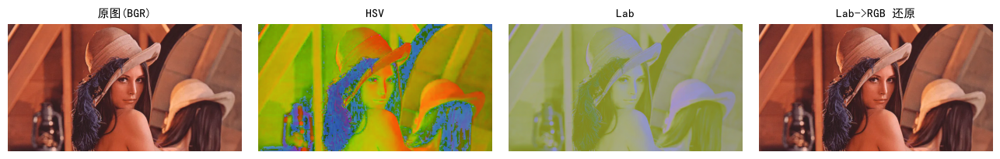

In [3]:
# 读取彩色图像，手写 RGB -> HSV / Lab，并保存各通道
img = cv_imread("lena.jpeg", cv2.IMREAD_COLOR)
assert img is not None, "读取 lena.jpeg 失败"

hsv_m = rgb_to_hsv_manual(img)
lab_m = rgb_to_lab_manual(img)

# 各通道单独保存
for name, channel in [("h", 0), ("s", 1), ("v", 2)]:
    cv_imwrite(f"{name}_channel.jpg", hsv_m[:, :, channel])
for name, channel in [("l", 0), ("a", 1), ("b", 2)]:
    cv_imwrite(f"{name}_channel.jpg", lab_m[:, :, channel])

# 从保存的单通道"图像"读回并重组，转换回 RGB
h_ch = cv_imread("h_channel.jpg", cv2.IMREAD_GRAYSCALE)
s_ch = cv_imread("s_channel.jpg", cv2.IMREAD_GRAYSCALE)
v_ch = cv_imread("v_channel.jpg", cv2.IMREAD_GRAYSCALE)
hsv_rebuilt = cv2.merge([h_ch, s_ch, v_ch])
restored_from_hsv = hsv_to_rgb_manual(hsv_rebuilt)

l_ch = cv_imread("l_channel.jpg", cv2.IMREAD_GRAYSCALE)
a_ch = cv_imread("a_channel.jpg", cv2.IMREAD_GRAYSCALE)
b_ch = cv_imread("b_channel.jpg", cv2.IMREAD_GRAYSCALE)
lab_rebuilt = cv2.merge([l_ch, a_ch, b_ch])
restored_from_lab = lab_to_rgb_manual(lab_rebuilt)

# ---------- 与 OpenCV 对比验证 ----------
hsv_cv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lab_cv = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
compare_results(hsv_m, hsv_cv, "RGB->HSV")
compare_results(lab_m, lab_cv, "RGB->Lab")
compare_results(restored_from_hsv, cv2.cvtColor(hsv_cv, cv2.COLOR_HSV2BGR), "HSV->RGB 还原")
compare_results(restored_from_lab, cv2.cvtColor(lab_cv, cv2.COLOR_Lab2BGR), "Lab->RGB 还原")

show_images([img, hsv_m, lab_m, restored_from_lab], ["原图(BGR)", "HSV", "Lab", "Lab->RGB 还原"], figsize=(13, 4))

💡 HSV 三通道直观含义：
   H = 色调（什么颜色，红/橙/黄/绿/青/蓝/紫...）
   S = 饱和度（颜色鲜艳度 = 0 就是灰度，= 255 就是最鲜艳）
   V = 明度（整体亮度，0 全黑 255 最亮）


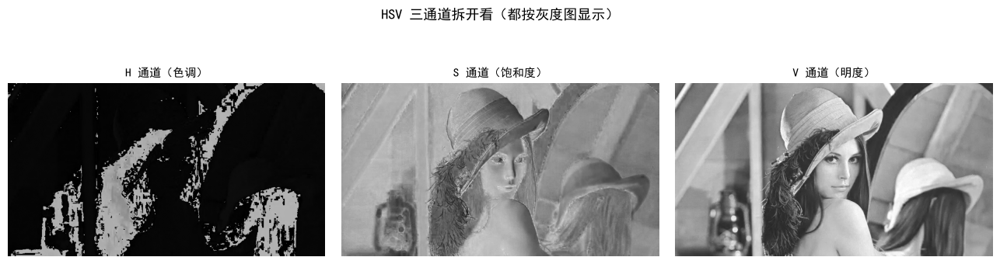


💡 Lab 三通道直观含义：
   L = 纯亮度信息（0 黑 / 100 白，等价于灰度图）
   a = 绿↔红 色轴（负值偏绿、正值偏红）
   b = 蓝↔黄 色轴（负值偏蓝、正值偏黄）


D:\python\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 8596 (\N{LEFT RIGHT ARROW}) missing from font(s) SimHei.
  fig.canvas.print_figure(bytes_io, **kw)


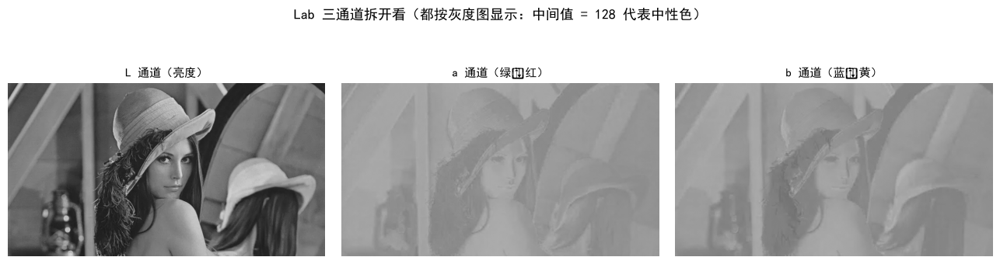

In [4]:
# ---------- 零基础：把 HSV 和 Lab 的各通道拆开看 ----------
print("💡 HSV 三通道直观含义：")
print("   H = 色调（什么颜色，红/橙/黄/绿/青/蓝/紫...）")
print("   S = 饱和度（颜色鲜艳度 = 0 就是灰度，= 255 就是最鲜艳）")
print("   V = 明度（整体亮度，0 全黑 255 最亮）")
show_images(
    [hsv_m[:, :, 0], hsv_m[:, :, 1], hsv_m[:, :, 2]],
    titles=["H 通道（色调）", "S 通道（饱和度）", "V 通道（明度）"],
    cmap="gray", suptitle="HSV 三通道拆开看（都按灰度图显示）",
    show_info=True, figsize=(13, 4)
)

print("\n💡 Lab 三通道直观含义：")
print("   L = 纯亮度信息（0 黑 / 100 白，等价于灰度图）")
print("   a = 绿↔红 色轴（负值偏绿、正值偏红）")
print("   b = 蓝↔黄 色轴（负值偏蓝、正值偏黄）")
show_images(
    [lab_m[:, :, 0], lab_m[:, :, 1], lab_m[:, :, 2]],
    titles=["L 通道（亮度）", "a 通道（绿↔红）", "b 通道（蓝↔黄）"],
    cmap="gray", suptitle="Lab 三通道拆开看（都按灰度图显示：中间值 = 128 代表中性色）",
    show_info=True, figsize=(13, 4)
)

## 三、颜色传递：统计量匹配的直觉

### 3.1 问题定义

给定两张图：

- **源图 S**：提供"内容"（我们想保留它的构图与形状）
- **目标图 T**：提供"颜色"（我们想借用它的色调）

目标：生成一张图，**内容像 S、颜色像 T**。

### 3.2 核心思想：让两个分布"对齐"

论文的做法非常朴素：**假设一张图的颜色分布可以用均值 $\mu$ 和标准差 $\sigma$ 概括**。
那么"把 T 的颜色传给 S"，就等价于：

1. 把 S 的每个通道**标准化**（减均值、除标准差）→ 得到均值为 0、标准差为 1 的分布；
2. 再**缩放到 T 的统计量**（乘 T 的标准差、加 T 的均值）。

$$
\text{out} = \underbrace{\frac{x_S - \mu_S}{\sigma_S}}_{\text{标准化}} \cdot \sigma_T + \mu_T
$$

如果是三个通道（如 lαβ 的 l、α、β），就**每个通道独立做一次**——这正是"去相关"带来的便利。

> ★ **关键观察**：颜色传递 = 逐通道的"均值/标准差匹配"。
> 它和灰度图的**直方图匹配**是同一个思想，只是从 1 个通道推广到了 3 个通道，
> 并且假设分布近似高斯（因此只需匹配前两阶矩）。

#### ✍️ 手算一遍（2 个像素，可自行核对）

设源图某个通道的 2 个像素值为 $x_S = [0.0,\ 1.0]$，目标图对应通道为 $x_T = [0.2,\ 0.8]$。

| 量 | 源图 S | 目标图 T |
|----|--------|----------|
| 均值 $\mu$ | $(0.0+1.0)/2 = 0.5$ | $(0.2+0.8)/2 = 0.5$ |
| 标准差 $\sigma$ | $\sqrt{\dfrac{(0.5)^2+(0.5)^2}{2}} = 0.5$ | $\sqrt{\dfrac{(0.3)^2+(0.3)^2}{2}} = 0.3$ |

套公式：

$$
x = 0.0 \Rightarrow \frac{0.0 - 0.5}{0.5} \times 0.3 + 0.5 = -1 \times 0.3 + 0.5 = 0.2
$$

$$
x = 1.0 \Rightarrow \frac{1.0 - 0.5}{0.5} \times 0.3 + 0.5 = +1 \times 0.3 + 0.5 = 0.8
$$

结果 $[0.2,\ 0.8]$ —— **恰好等于目标图的分布**。✅ 源图的"对比度"被压到了目标图的水平。

> 若把 $\sigma_T$ 换成 $0.5$（目标图对比度与源图相同）、$\mu_T$ 换成 $1.5$，
> 则结果是 $[1.0,\ 2.0]$：整体**平移**了 1.0，形状不变。可见
> $\sigma_T/\sigma_S$ 控制**对比度**，$\mu_T$ 控制**整体明暗/色调**。

### 3.3 先跑通一个简化版（在 Lab 空间）

Lab 空间实现简单，先跑通它建立手感：

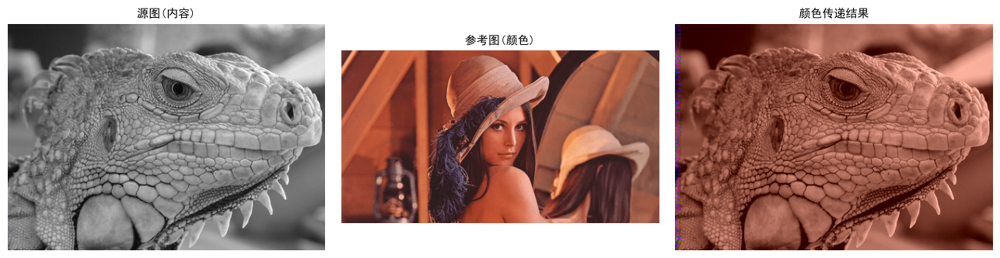

In [5]:
# 手写颜色传递：把 chong.png 的色彩迁移到 lena.jpeg 上
source = cv_imread("chong.png", cv2.IMREAD_COLOR)
target = cv_imread("lena.jpeg", cv2.IMREAD_COLOR)
source = rgba_to_bgr(source) if source.shape[2] == 4 else source

transferred = color_transfer_manual(source, target)
cv_imwrite("color_transferred.jpg", transferred)
show_images([source, target, transferred], ["源图(内容)", "参考图(颜色)", "颜色传递结果"], figsize=(13, 4))

## 四、lαβ 色彩空间：论文原版算法

### 4.1 为什么是 lαβ？

Reinhard 等人的核心论点是：

> 在 RGB（乃至 Lab）里，通道之间**存在相关性**。想"连贯地"改一个像素的颜色，就得同时改所有通道，
> 这让任何颜色操作都变复杂。所以需要一个**轴之间不相关**的正交颜色空间。

lαβ 由 Ruderman 等人从**人眼视觉系统处理自然场景**的数据研究中导出（本质是对 LMS 锥体响应做 PCA 去相关）：

| 通道 | 物理含义 | 类比对手色模型 |
|------|----------|----------------|
| $l$ | 消色差（achromatic）通道 | $\propto r + g + b$（亮度） |
| $\alpha$ | 黄—蓝 对立通道 | $\propto r + g - b$ |
| $\beta$ | 红—绿 对立通道 | $\propto r - g$ |

此外它是**对数空间**：$\log x^\gamma = \gamma \log x$，因此对未知 Gamma 的图像天然鲁棒——
Gamma 只会在对数域里产生一个常数偏移。

### 4.2 转换链路（论文公式 4~9）

| 步骤 | 操作 | 说明 |
|------|------|------|
| 1 | RGB → LMS | 一个全正系数矩阵，避免取对数出现负数 |
| 2 | LMS → log₁₀(LMS) | 压缩数据偏斜，进入对数空间 |
| 3 | log(LMS) → lαβ | PCA 去相关矩阵 |
| 4 | 处理后逆向：lαβ → log(LMS) → LMS → RGB | 用逆矩阵还原 |

**RGB → LMS**（论文式 4）：

$$
\begin{bmatrix} L \\ M \\ S \end{bmatrix}
= \begin{bmatrix}
0.3811 & 0.5783 & 0.0402 \\
0.1967 & 0.7244 & 0.0782 \\
0.0241 & 0.1288 & 0.8444
\end{bmatrix}
\begin{bmatrix} R \\ G \\ B \end{bmatrix}
$$

**log(LMS) → lαβ**（论文式 6，PCA 去相关）：

$$
\begin{bmatrix} l \\ \alpha \\ \beta \end{bmatrix}
= \begin{bmatrix}
\frac{1}{\sqrt{3}} & \frac{1}{\sqrt{3}} & \frac{1}{\sqrt{3}} \\[4pt]
\frac{1}{\sqrt{6}} & \frac{1}{\sqrt{6}} & \frac{-2}{\sqrt{6}} \\[4pt]
\frac{1}{\sqrt{2}} & \frac{-1}{\sqrt{2}} & 0
\end{bmatrix}
\begin{bmatrix} L' \\ M' \\ S' \end{bmatrix},
\qquad L' = \log_{10} L
$$

**LMS → RGB**（论文式 9，用于逆向）：

$$
\begin{bmatrix} R \\ G \\ B \end{bmatrix}
= \begin{bmatrix}
4.4679 & -3.5873 & 0.1193 \\
-1.2186 & 2.3809 & -0.1624 \\
0.0497 & -0.2439 & 1.2045
\end{bmatrix}
\begin{bmatrix} L \\ M \\ S \end{bmatrix}
$$

### ✍️ 手算一遍：白色和红色在 lαβ 里长什么样？

**（1）纯白 $\text{RGB}=(1,1,1)$**

第一步 LMS（矩阵行和）：

$$
L = 0.3811 + 0.5783 + 0.0402 = 0.9996,\quad
M = 0.1967 + 0.7244 + 0.0782 = 0.9993,\quad
S = 0.0241 + 0.1288 + 0.8444 = 0.9973
$$

取对数（$\log_{10}$）：$L' \approx -0.00017$，$M' \approx -0.00030$，$S' \approx -0.00117$。

$$
l = \frac{L' + M' + S'}{\sqrt{3}} = \frac{-0.00164}{1.7321} \approx -0.001
$$

$$
\alpha = \frac{L' + M' - 2S'}{\sqrt{6}} = \frac{-0.00047 + 0.00234}{2.4495} \approx 0.001
\qquad
\beta = \frac{L' - M'}{\sqrt{2}} = \frac{0.00013}{1.4142} \approx 0.0001
$$

得到 $(l, \alpha, \beta) \approx (0, 0, 0)$：**白色的两个色度通道都接近 0**，符合"中性色"的预期。✅

**（2）纯红 $\text{RGB}=(1,0,0)$**

LMS $= (0.3811,\ 0.1967,\ 0.0241)$，取对数 $\to (-0.4190,\ -0.7061,\ -1.6180)$。

$$
l = \frac{-0.4190 - 0.7061 - 1.6180}{1.7321} = \frac{-2.7431}{1.7321} \approx -1.584
$$

$$
\alpha = \frac{-0.4190 - 0.7061 + 3.2360}{2.4495} = \frac{2.1109}{2.4495} \approx 0.862
\qquad
\beta = \frac{-0.4190 + 0.7061}{1.4142} = \frac{0.2871}{1.4142} \approx 0.203
$$

得到 $(l, \alpha, \beta) \approx (-1.584,\ 0.862,\ 0.203)$。

> ★ **关键观察**：红色($r>g$)时 $\beta > 0$，且 $\alpha > 0$（偏黄）——正好对应论文式 7 中
> $\beta \propto r - g$、$\alpha \propto r + g - b$ 的对手色含义。白色则落在 $(0,0,0)$。
> **这说明 lαβ 的坐标轴确实是有明确物理意义的，而不是数学玩具。**

### 4.3 手写实现：转换 + 颜色传递

下面用 NumPy 手写论文全流程：RGB→LMS→log→lαβ，往返验证：MAE 与 PSNR 用于确认转换无损。
注意 `l` 是亮度通道，`α`/`β` 是色度通道——传递时三通道**各自独立**做统计量匹配。

1. RGB -> l-alpha-beta -> RGB 往返转换验证
往返 MAE（平均绝对误差）: 0.3608
往返 PSNR: 56.99 dB


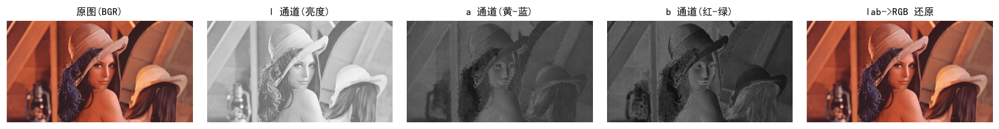

l-alpha-beta 各通道已保存为 lab_space_*_channel.jpg

2. l-alpha-beta 空间颜色传递
源图 lab 均值: l=-0.5897, a=0.0007, b=0.0001
源图 lab 标准差: l=0.3345, a=0.0047, b=0.0002
目标图 lab 均值: l=-0.9043, a=0.1270, b=0.0422
目标图 lab 标准差: l=0.3384, a=0.0657, b=0.0138


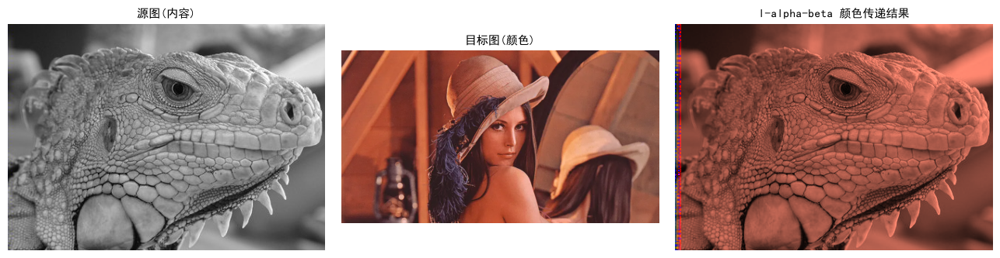

颜色传递结果已保存为 lab_space_transferred.jpg

3. 对比：l-alpha-beta 空间 vs Lab 空间颜色传递


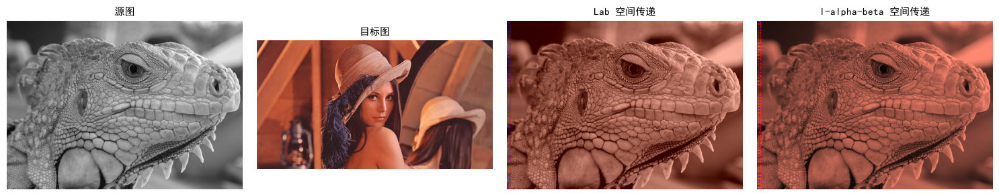

左：Lab 空间（简化版）  右：l-alpha-beta 空间（论文原版）


In [6]:
# ==================== lαβ 色彩空间转换与颜色传递（手写实现） ====================
# 参考：Reinhard et al., Color Transfer between Images, IEEE CG&A, 2001

import sys
from pathlib import Path

# 向上查找项目根目录（含 utils.py）
ROOT = Path.cwd().resolve()
while not (ROOT / 'utils.py').exists():
    if ROOT.parent == ROOT:
        raise FileNotFoundError('未找到项目根目录 utils.py')
    ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))

import numpy as np
import cv2
from utils import cv_imread, cv_imwrite, show_images

# ---------- 转换矩阵定义 ----------

# RGB -> LMS 合并矩阵（论文公式 4，全部为正，避免 log 负数问题）
M_rgb2lms = np.array([
    [0.3811, 0.5783, 0.0402],
    [0.1967, 0.7244, 0.0782],
    [0.0241, 0.1288, 0.8444]
], dtype=np.float64)

# LMS -> RGB 逆矩阵（论文公式 9）
M_lms2rgb = np.array([
    [ 4.4679, -3.5873,  0.1193],
    [-1.2186,  2.3809, -0.1624],
    [ 0.0497, -0.2439,  1.2045]
], dtype=np.float64)

# log(LMS) -> l-alpha-beta（PCA 去相关矩阵，论文公式 5）
sqrt3, sqrt6, sqrt2 = np.sqrt(3), np.sqrt(6), np.sqrt(2)
M_loglms2lab = np.array([
    [1/sqrt3,  1/sqrt3,  1/sqrt3],
    [1/sqrt6,  1/sqrt6, -2/sqrt6],
    [1/sqrt2, -1/sqrt2,  0.0]
], dtype=np.float64)

# 逆矩阵：l-alpha-beta -> log(LMS)
M_lab2loglms = np.linalg.inv(M_loglms2lab)

# ---------- 正向转换：RGB -> l-alpha-beta ----------

def rgb_to_lab_space(image):
    # 手写 RGB(BGR) -> l-alpha-beta 转换
    # 链路：RGB -> LMS -> log(LMS) -> l-alpha-beta
    # 输入：uint8 BGR 图像 (h, w, 3)
    # 输出：float64 l-alpha-beta 图像 (h, w, 3)
    img = image.astype(np.float64) / 255.0
    rgb = img[:, :, ::-1].copy()  # BGR -> RGB

    h, w, _ = rgb.shape
    pixels = rgb.reshape(-1, 3)

    # 步骤1：RGB -> LMS（合并矩阵，全为正，避免 log 负数）
    lms = pixels @ M_rgb2lms.T

    # 步骤2：LMS -> log(LMS)，取以 10 为底的对数
    lms_log = np.log10(lms + 1e-10)

    # 步骤3：log(LMS) -> l-alpha-beta（PCA 去相关）
    lab = lms_log @ M_loglms2lab.T

    return lab.reshape(h, w, 3)

# ---------- 逆向转换：l-alpha-beta -> RGB ----------

def lab_space_to_rgb(lab_img):
    # 手写 l-alpha-beta -> RGB 逆转换
    # 链路：l-alpha-beta -> log(LMS) -> LMS -> RGB
    h, w, _ = lab_img.shape
    pixels = lab_img.reshape(-1, 3)

    # 步骤1：l-alpha-beta -> log(LMS)
    lms_log = pixels @ M_lab2loglms.T

    # 步骤2：log(LMS) -> LMS
    lms = 10 ** lms_log

    # 步骤3：LMS -> RGB
    rgb = lms @ M_lms2rgb.T

    rgb = np.clip(rgb, 0, 1)
    rgb_uint8 = (rgb * 255).astype(np.uint8)
    bgr = rgb_uint8[:, ::-1].copy()

    return bgr.reshape(h, w, 3)

# ---------- l-alpha-beta 颜色传递算法 ----------

def color_transfer_lab_space(source, target):
    # 在 l-alpha-beta 空间中实现颜色传递（Reinhard 方法）
    src_lab = rgb_to_lab_space(source)
    tgt_lab = rgb_to_lab_space(target)

    src_mean = np.mean(src_lab.reshape(-1, 3), axis=0)
    src_std = np.std(src_lab.reshape(-1, 3), axis=0)
    tgt_mean = np.mean(tgt_lab.reshape(-1, 3), axis=0)
    tgt_std = np.std(tgt_lab.reshape(-1, 3), axis=0)

    print(f'源图 lab 均值: l={src_mean[0]:.4f}, a={src_mean[1]:.4f}, b={src_mean[2]:.4f}')
    print(f'源图 lab 标准差: l={src_std[0]:.4f}, a={src_std[1]:.4f}, b={src_std[2]:.4f}')
    print(f'目标图 lab 均值: l={tgt_mean[0]:.4f}, a={tgt_mean[1]:.4f}, b={tgt_mean[2]:.4f}')
    print(f'目标图 lab 标准差: l={tgt_std[0]:.4f}, a={tgt_std[1]:.4f}, b={tgt_std[2]:.4f}')

    result_lab = np.zeros_like(src_lab)
    for ch in range(3):
        result_lab[:, :, ch] = src_lab[:, :, ch] - src_mean[ch]
        result_lab[:, :, ch] = result_lab[:, :, ch] * (tgt_std[ch] / (src_std[ch] + 1e-10))
        result_lab[:, :, ch] = result_lab[:, :, ch] + tgt_mean[ch]

    result = lab_space_to_rgb(result_lab)
    return result

# ---------- 验证：RGB -> l-alpha-beta -> RGB 往返测试 ----------

print('='*60)
print('1. RGB -> l-alpha-beta -> RGB 往返转换验证')
print('='*60)

img = cv_imread('lena.jpeg', cv2.IMREAD_COLOR)
assert img is not None, '读取 lena.jpeg 失败'

lab_img = rgb_to_lab_space(img)
restored = lab_space_to_rgb(lab_img)

mae = np.mean(np.abs(img.astype(np.float64) - restored.astype(np.float64)))
print(f'往返 MAE（平均绝对误差）: {mae:.4f}')
print(f'往返 PSNR: {20 * np.log10(255.0 / (mae + 1e-10)):.2f} dB')

# 保存 l-alpha-beta 各通道可视化（归一化到 0-255）
lab_vis = np.zeros_like(img)
for ch in range(3):
    ch_data = lab_img[:, :, ch]
    ch_min, ch_max = ch_data.min(), ch_data.max()
    if ch_max - ch_min > 1e-10:
        lab_vis[:, :, ch] = ((ch_data - ch_min) / (ch_max - ch_min) * 255).astype(np.uint8)
    else:
        lab_vis[:, :, ch] = 0

cv_imwrite('lab_space_l_channel.jpg', lab_vis[:, :, 0])
cv_imwrite('lab_space_a_channel.jpg', lab_vis[:, :, 1])
cv_imwrite('lab_space_b_channel.jpg', lab_vis[:, :, 2])

show_images(
    [img, lab_vis[:, :, 0], lab_vis[:, :, 1], lab_vis[:, :, 2], restored],
    ['原图(BGR)', 'l 通道(亮度)', 'a 通道(黄-蓝)', 'b 通道(红-绿)', 'lab->RGB 还原'],
    figsize=(15, 4)
)
print('l-alpha-beta 各通道已保存为 lab_space_*_channel.jpg')

# ---------- 颜色传递 ----------

print()
print('='*60)
print('2. l-alpha-beta 空间颜色传递')
print('='*60)

source = cv_imread('chong.png', cv2.IMREAD_COLOR)
target = cv_imread('lena.jpeg', cv2.IMREAD_COLOR)
assert source is not None and target is not None, '读取图像失败'

if source.shape[2] == 4:
    source = source[:, :, :3]

transferred = color_transfer_lab_space(source, target)
cv_imwrite('lab_space_transferred.jpg', transferred)

show_images(
    [source, target, transferred],
    ['源图(内容)', '目标图(颜色)', 'l-alpha-beta 颜色传递结果'],
    figsize=(13, 4)
)
print('颜色传递结果已保存为 lab_space_transferred.jpg')

# ---------- 对比 ----------

print()
print('='*60)
print('3. 对比：l-alpha-beta 空间 vs Lab 空间颜色传递')
print('='*60)

lab_transferred = cv_imread('color_transferred.jpg', cv2.IMREAD_COLOR)
if lab_transferred is not None:
    show_images(
        [source, target, lab_transferred, transferred],
        ['源图', '目标图', 'Lab 空间传递', 'l-alpha-beta 空间传递'],
        figsize=(15, 4)
    )
    print('左：Lab 空间（简化版）  右：l-alpha-beta 空间（论文原版）')
else:
    print('未找到 Lab 空间传递结果，跳过对比')


## 五、chia56028 GitHub 实现对比

### 5.1 为什么需要 lαβ 颜色空间？

在 RGB 空间中，三个通道之间**相关性极强**——当蓝色通道值较大时，红色和绿色通道值往往也很大。
这意味着在 RGB 空间中单独调整某个通道，会不可避免地影响其他通道，难以实现独立的颜色控制。

> 来源：[知乎@七月初 — Color transfer between images 解析](https://zhuanlan.zhihu.com/p/51935819)
> "在 RGB space 中，RGB 三个通道之间的相关性太强，为此，作者想使用一种正交的 color space。"

Reinhard 等人选择了 $l\alpha\beta$ 空间，这个空间在当时**最小化了不同通道之间的相关性**，
使得对某个通道进行操作时，对其他通道的影响很小。此外，$l\alpha\beta$ 是**对数空间**，
意味着一阶近似值（即通道强度变化）能够被检测到，这在感知上更接近人眼对亮度的响应。

> 来源：[CSDN@风翼冰舟 — 图像颜色迁移](https://blog.csdn.net/zb1165048017/article/details/108981254)
> "lαβ 颜色空间最小化了各通道之间的联系，而且这个颜色空间是对数空间，
> 意味着一阶近似值即通道强度变化同样能够被检测到。"

### 5.2 完整的 RGB → lαβ 转换链路

论文的转换分为三步，CSDN 博客给出了完整的矩阵公式和代码：

**Step 1: RGB → LMS**（合并矩阵，行和为 1）

$$
\begin{bmatrix} L \\ M \\ S \end{bmatrix}
= \begin{bmatrix} 0.3811 & 0.5783 & 0.0402 \\ 0.1967 & 0.7244 & 0.0782 \\ 0.0241 & 0.1288 & 0.8444 \end{bmatrix}
\begin{bmatrix} R \\ G \\ B \end{bmatrix}
$$

> 作者基于 XYZitu601-1 (D65) 转换标准做了优化，使矩阵每行加和为 1。
> 来源：[CSDN@风翼冰舟](https://blog.csdn.net/zb1165048017/article/details/108981254)

**Step 2: 取对数**（以 10 为底）

$$L' = \log_{10}(L), \quad M' = \log_{10}(M), \quad S' = \log_{10}(S)$$

> 取对数的目的是将乘性关系转换为加性关系，使数据分布更接近高斯分布。
> 来源：[知乎@七月初](https://zhuanlan.zhihu.com/p/51935819)

**Step 3: LMS → lαβ**

$$
\begin{bmatrix} l \\ \alpha \\ \beta \end{bmatrix}
= \begin{bmatrix} \frac{1}{\sqrt{3}} & 0 & 0 \\ 0 & \frac{1}{\sqrt{6}} & 0 \\ 0 & 0 & \frac{1}{\sqrt{2}} \end{bmatrix}
\begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & -2 \\ 1 & -1 & 0 \end{bmatrix}
\begin{bmatrix} L' \\ M' \\ S' \end{bmatrix}
$$

如果将 LMS 分别当作红、绿、蓝，则：
- $l$ 轴：**非彩色通道**（achromatic），类似亮度
- $\alpha$ 轴：**黄-蓝对抗通道**（注意：此处与 OpenCV Lab 的 a 通道不同）
- $\beta$ 轴：**红-绿对抗通道**

### 5.3 颜色校正公式

知乎文章给出了完整的四步统计量匹配过程：

> **a)** 分别分通道计算源图像与目标图像的像素均值 $\mu$ 与标准差 $\sigma$
>
> **b)** 源图像逐像素减去对应通道的均值：
> $$l^* = l_{src} - \mu_{src}$$
>
> **c)** 逐像素乘以目标图与源图标准差之比：
> $$l^{**} = l^* \times \frac{\sigma_{dst}}{\sigma_{src}}$$
>
> **d)** 逐像素加上目标图均值：
> $$l_{result} = l^{**} + \mu_{dst}$$
>
> 来源：[知乎@七月初](https://zhuanlan.zhihu.com/p/51935819)

### 5.4 简化版实现：OpenCV BGR2LAB 方案

GitHub 开源项目 [chia56028/Color-Transfer-between-Images](https://github.com/chia56028/Color-Transfer-between-Images)
提供了一种**极简实现**：直接使用 `cv2.cvtColor(BGR2LAB)` 完成颜色空间转换，
然后用**三重 for 循环**逐像素遍历做统计量匹配。

CSDN 博客中给出了 chia56028 实现的核心代码：

```python
def RGB2LAB(rgb):
    # RGB to LMS
    cvt_mat = np.array([[0.3811, 0.5783, 0.0402],
                        [0.1967, 0.7244, 0.0782],
                        [0.0241, 0.1288, 0.8444]])
    lms = np.zeros_like(rgb)
    for i in range(rgb.shape[0]):
        for j in range(rgb.shape[1]):
            lms[i,j] = np.dot(cvt_mat, rgb[i,j])
    lms[lms==0] = 1
    lms = np.log10(lms)
    # LMS to lab
    lms_lab_mat1 = np.array([[1/np.sqrt(3), 0, 0],
                             [0, 1/np.sqrt(6), 0],
                             [0, 0, 1/np.sqrt(2)]])
    lms_lab_mat2 = np.array([[1,1,1],[1,1,-2],[1,-1,0]])
    lms_lab_mat = np.dot(lms_lab_mat1, lms_lab_mat2)
    lab = np.zeros_like(lms)
    for i in range(lms.shape[0]):
        for j in range(lms.shape[1]):
            lab[i,j] = np.dot(lms_lab_mat, lms[i,j])
    return lab
```

> 代码出处：[CSDN@风翼冰舟](https://blog.csdn.net/zb1165048017/article/details/108981254)

### 5.5 我们的实现 vs chia56028 对比

| 对比维度 | 我们的手写实现 | chia56028 实现 |
|------|----------|----------------|
| 颜色空间 | 手写 RGB→LMS→log→lαβ（论文原版） | `cv2.COLOR_BGR2LAB`（OpenCV 内置 Lab） |
| 转换矩阵 | 3 个手写矩阵 + 对数运算 | OpenCV 内部封装，不透明 |
| 遍历方式 | NumPy 向量化 | 三重 for 循环（像素级遍历） |
| 截断方式 | `np.clip` | 手工 `if` 判断 |
| 统计量匹配 | `(x - μ_s)/σ_s × σ_t + μ_t` | 同左（公式完全一致） |
| 参考来源 | Reinhard 原论文 | OpenCV 文档 + 原论文 |

> ★ **关键观察**：chia56028 用的是 **Lab 空间**而非论文原版的 **lαβ 空间**。
> OpenCV 的 `COLOR_BGR2LAB` 内部已经做了 sRGB 线性化、XYZ 转换和 Lab 非线性映射，
> 但**没有做 LMS 对数变换和 PCA 去相关**——所以严格来说它不是论文的完整实现，
> 而是一种工程简化。效果上两者差异不大，但 lαβ 在理论上更"正确"。
>
> 此外，CSDN 博客指出 chia56028 的代码实际上包含了完整的 RGB2LAB 和 LAB2RGB 函数，
> 可以在论文原版 lαβ 空间中操作。而我们这里直接用 OpenCV 的 Lab 是更简化的版本。
>
> 来源：[chia56028/Color-Transfer-between-Images](https://github.com/chia56028/Color-Transfer-between-Images) 的 `color_transfer.py`
> 和 [CSDN@风翼冰舟](https://blog.csdn.net/zb1165048017/article/details/108981254) 的代码分析

源图 s1.bmp shape: (512, 768, 3)
目标图 t1.bmp shape: (512, 768, 3)


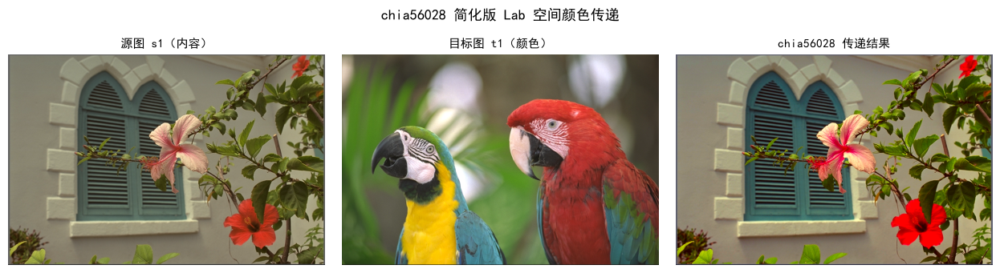

In [7]:
# ==================== chia56028 简化版颜色传递实现 ====================
# 代码出处：https://github.com/chia56028/Color-Transfer-between-Images
# 适配说明：保留原版算法逻辑，适配本项目 utils.py 的中文路径读写

import sys
from pathlib import Path

ROOT = Path.cwd().resolve()
while not (ROOT / 'utils.py').exists():
    if ROOT.parent == ROOT:
        raise FileNotFoundError('未找到项目根目录 utils.py')
    ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))

import numpy as np
import cv2
from utils import cv_imread, cv_imwrite, show_images, compare_results

def get_mean_and_std(x):
    """计算图像各通道的均值和标准差（与 chia56028 原版一致）。"""
    x_mean, x_std = cv2.meanStdDev(x)
    x_mean = np.hstack(np.around(x_mean, 2))
    x_std = np.hstack(np.around(x_std, 2))
    return x_mean, x_std

def color_transfer_chia56028(source_bgr, target_bgr):
    """chia56028 简化版颜色传递：在 Lab 空间做统计量匹配。

    与原版的区别：
    1. 使用 cv2.COLOR_BGR2LAB（而非手写 RGB→lαβ）
    2. 像素级三重循环遍历（原版风格，未向量化）
    3. 手工截断 0~255

    参数:
        source_bgr: 源图像（BGR，提供内容）
        target_bgr: 目标图像（BGR，提供颜色）
    返回:
        颜色传递后的 BGR 图像
    """
    # 转 Lab 空间
    s_lab = cv2.cvtColor(source_bgr, cv2.COLOR_BGR2LAB)
    t_lab = cv2.cvtColor(target_bgr, cv2.COLOR_BGR2LAB)

    s_mean, s_std = get_mean_and_std(s_lab)
    t_mean, t_std = get_mean_and_std(t_lab)

    height, width, channel = s_lab.shape
    # 原版三重循环遍历（保留原汁原味，不做向量化优化）
    for i in range(height):
        for j in range(width):
            for k in range(channel):
                x = s_lab[i, j, k]
                x = ((x - s_mean[k]) * (t_std[k] / s_std[k])) + t_mean[k]
                x = round(x)
                x = 0 if x < 0 else x
                x = 255 if x > 255 else x
                s_lab[i, j, k] = x

    result = cv2.cvtColor(s_lab, cv2.COLOR_LAB2BGR)
    return result

# 读取 chia56028 仓库的示例图片
source = cv_imread("s1.bmp", cv2.IMREAD_COLOR)
target = cv_imread("t1.bmp", cv2.IMREAD_COLOR)
assert source is not None, "读取 s1.bmp 失败"
assert target is not None, "读取 t1.bmp 失败"

print("源图 s1.bmp shape:", source.shape)
print("目标图 t1.bmp shape:", target.shape)

# 运行 chia56028 简化版颜色传递
result_chia = color_transfer_chia56028(source, target)

# 保存结果
cv_imwrite("chia56028_result.jpg", result_chia)

# 并排展示：源图 → 目标图 → 传递结果
show_images(
    [source, target, result_chia],
    titles=["源图 s1（内容）", "目标图 t1（颜色）", "chia56028 传递结果"],
    suptitle="chia56028 简化版 Lab 空间颜色传递"
)

官方参考结果 r1.bmp shape: (512, 768, 3)


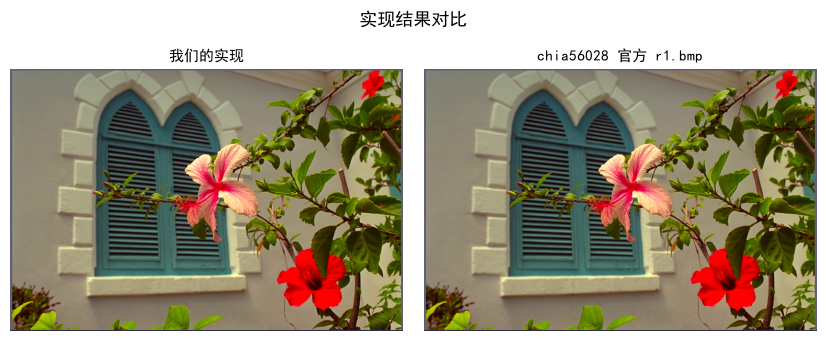

  🔍 【chia56028 简化版 vs 官方结果】手写实现 vs 参考实现 数值对比报告
  MAE  平均绝对误差  = 0.000000    ✅ 优秀
  RMSE 均方根误差    = 0.000000    ✅ 优秀
  Max  最大绝对误差  = 0.000000    ✅ 优秀
  🎉 恭喜！误差仅来自 uint8 取整，手写实现与参考实现基本一致。

补充验证：用 lena.jpeg + chong.png 做相同算法的 Lab 简化版


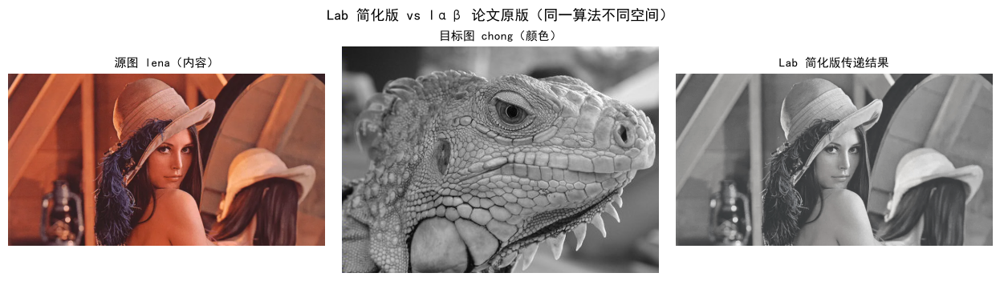

In [8]:
# ==================== 与 chia56028 官方结果 r1.bmp 对比 ====================
# r1.bmp 是 chia56028 仓库中提供的官方运行结果

ref_result = cv_imread("r1.bmp", cv2.IMREAD_COLOR)
assert ref_result is not None, "读取 r1.bmp 失败"

print("官方参考结果 r1.bmp shape:", ref_result.shape)

# 对比我们的实现与官方结果
show_images(
    [result_chia, ref_result],
    titles=["我们的实现", "chia56028 官方 r1.bmp"],
    suptitle="实现结果对比"
)

# 数值对比报告
compare_results(result_chia, ref_result, name="chia56028 简化版 vs 官方结果", mae_good=5.0, max_good=15.0)

# 同时对比我们论文原版 lαβ 实现（如果上面的 cell 11 已执行）
# 注意：这里用 chong.png → lena.jpeg 的结果做独立验证
print()
print("补充验证：用 lena.jpeg + chong.png 做相同算法的 Lab 简化版")
lena = cv_imread("lena.jpeg", cv2.IMREAD_COLOR)
chong = cv_imread("chong.png", cv2.IMREAD_COLOR)
if chong.shape[2] == 4:
    chong = chong[:, :, :3]

result_lab_simple = color_transfer_chia56028(lena, chong)
cv_imwrite("lab_simple_result.jpg", result_lab_simple)
show_images(
    [lena, chong, result_lab_simple],
    titles=["源图 lena（内容）", "目标图 chong（颜色）", "Lab 简化版传递结果"],
    suptitle="Lab 简化版 vs lαβ 论文原版（同一算法不同空间）"
)

## 六、色彩传递方法分类（学术综述）

> 本节内容参考：滕秀花、陈敏、林志强.《图像色彩传递技术的发展与展望》.
> 计算机科学与应用, 2013, 3, 91-95.
> [PDF](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

### 6.1 色彩传递的定义

色彩传递是近年来图像处理领域提出的一个新课题。所谓色彩传递，就是给定源图像和目标图像，
将源图像的颜色信息传递给目标图像，使目标图像具有源图像的色彩情境。

色彩传递可用于：
- 彩色视觉对象的**色彩校正**和再渲染
- 改变彩色对象的**光照效果**
- **灰度图像上色**，提高灰度图像的视觉效果
- 商业广告、动漫、医学等领域的广泛应用

> 来源：[滕秀花等, 2013, 引言部分](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

### 6.2 颜色空间的选择

在色彩传递过程中，颜色空间的选择对算法传递效果具有很大的影响。
论文指出，$l\alpha\beta$ 颜色空间的三个分量近似正交，能够最大限度地减小一个分量的变化给另外两个分量造成的影响。

转换步骤为：
1. **RGB → LMS**：使用矩阵乘法
2. **LMS → 对数空间**：取 $\log_{10}$
3. **LMS → $l\alpha\beta$**：使用 PCA 去相关矩阵

> 来源：[滕秀花等, 2013, 第 2 节](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

### 6.3 方法分类体系

滕秀花等将色彩传递方法按**匹配粒度**分为两大类：

```
色彩传递方法
├── 全局方法（基于图像整体统计量）
│   ├── 低阶统计变换（均值 + 标准差）       ← Reinhard (2001)，本章已实现
│   ├── 高阶统计变换（斜度 + 峰度）          ← 下方实现
│   └── 基于聚类的方法（分区域多组统计量）   ← 下方介绍
│
└── 像素匹配方法（逐像素找最佳匹配）
    ├── 像素点单独匹配（加权距离）           ← Welsh et al. (2002)
    └── 像素点颜色扩展（空间相关性约束）     ← Levin et al. (2004)
```

### 6.4 全局色彩传递

#### 6.4.1 低阶统计变换（Reinhard 2001）

Reinhard 等人使用低阶统计信息——**均值**和**标准差**：
1. 计算源图像和目标图像各个通道的均值 $\mu^{src}_l, \mu^{src}_\alpha, \mu^{src}_\beta$ 和 $\mu^{dst}_l, \mu^{dst}_\alpha, \mu^{dst}_\beta$
2. 计算标准差 $\sigma^{src}_l, \sigma^{src}_\alpha, \sigma^{src}_\beta$ 和 $\sigma^{dst}_l, \sigma^{dst}_\alpha, \sigma^{dst}_\beta$
3. 变换公式：

$$l' = \frac{l_{src} - \mu^{src}_l}{\sigma^{src}_l} \times \sigma^{dst}_l + \mu^{dst}_l$$

对 $\alpha$ 和 $\beta$ 通道同理。经过运算使目标图像和源图的各通道低阶统计信息一致，达到色彩传递的效果。

> ★ **核心假设**：图像颜色分布近似高斯分布。当源图颜色比较丰富时传递效果较差，
> 因为目标图中的颜色在做全局性调整后，合成图像中可能出现源图和目标图中都不存在的新颜色。
> 来源：[滕秀花等, 2013, 第 3.1 节](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

#### 6.4.2 高阶统计变换

由于自然图像中包含大量的**局部性、方向性、带通性结构**，这些细节在低阶统计信息中体现不够充分。
**高阶统计信息**——斜度（skewness，三阶矩）和峰度（kurtosis，四阶矩）可以体现图像的细节信息。

赵国英等人对源图像的斜度和峰度进行**模变换或幂变换**，使源图像的斜度或峰度接近于目标图像，
目的是使结果图像和源图像具有相似的三阶或四阶统计性质，从而使颜色变换的效果更加真实。

- **斜度** $= E[(x - \mu)^3] / \sigma^3$，衡量分布的不对称性
- **峰度** $= E[(x - \mu)^4] / \sigma^4 - 3$，衡量分布尾部的厚度

> 来源：[滕秀花等, 2013, 第 3.2 节](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)
> 原始方法来自：赵国英, 向世明, 李华. 高阶矩在颜色传输中的应用. 计算机辅助设计和图形学学报, 2004.

#### 6.4.3 基于聚类的区域色彩传递

当图像中包含多个不同颜色区域时，全局传递算法可能失效。Welsh 等人采用**分而治之**的方法，
但未能提供足够的分区信息。

钱小燕、张二虎等对源图像和目标图像进行**颜色聚类分析**：
1. 根据输入图像聚类域的统计信息
2. 在样本图像中找到一个与统计信息最接近的域作为该聚类域的**匹配域**
3. 将**隶属度向量**引入色彩传递方程
4. 实现图像间的自动色彩传递

> 弊端：可能区域配对错误，经常出现颜色信息不连续，特别是边界颜色过渡不平滑，需要进一步的平滑处理。
> 来源：[滕秀花等, 2013, 第 4 节](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

### 6.5 像素点颜色传递

#### 6.5.1 像素点单独匹配（Welsh et al. 2002）

基于像素点色彩传递，根据**像素领域的特征相似性**进行配对，把源图配对像素的颜色信息传递到目标图像的相应像素。

算法步骤：
1. 将源图和目标图转换到 $l\alpha\beta$ 色彩空间
2. 对目标图像的亮度通道 $l$ 采用高斯分布模型做**归一化处理**，使源图和目标图像的亮度通道均值和方差均相同
3. 对源图像提取一定比例的**样本点**，目标图像像素点与样本点之间作如下计算：

$$E = (\sigma_t \times \sigma_s)^{0.5} \times (l_t - l_s)^2 + ...$$

其中：
- $E$ 为权值（匹配距离）
- $l_t$ 为目标图像像素点的亮度值
- $l_s$ 为源图像样本点的亮度值
- $\sigma_t$ 为目标图像像素点周围某个邻域内亮度值的均方差
- $\sigma_s$ 为源图样本点邻域内亮度值的均方差

4. 为目标图像的像素查找权值最接近的样本点，将样本点的彩色通道取值赋值给目标图对应像素点
5. 目标图转换回 RGB 彩色空间，完成色彩传递

> ★ **样本集大小**：内容单一的图像随机提取 30% 的像素点构成样本集合时效果良好；
> 图像内容稍微复杂的则需要提取 70% 像素点。
> 来源：[滕秀花等, 2013, 第 5.1 节](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

**存在的问题**：
1. 结果图像出现**噪声像素**，或大面积的误传
2. 需要建立大样本集合，算法**复杂度大**

#### 6.5.2 像素点颜色扩展（Levin et al. 2004）

扩展类算法考虑了像素间的**空间相关性**原理：相邻像素只有亮度相近时才能分配相近的颜色。

**Levin 的算法**：通过对邻域像素分配一个**决定于亮度的权值**较好地解决了边界定位问题。
用户事先在各区域粗略地涂上颜色线条，不同颜色的彩色线条在一定范围内扩展，最后在物体边界汇合。

**滕升华的算法**：根据**梯度引导**颜色线条扩展，把色彩传递转换为对**拉普拉斯方程**的求解问题。

**孟敏的算法**：结合了 Levin 的算法思想，用线条指定两幅图像的传递区域，达到局部颜色传递的目的，
然后根据梯度扩展颜色信息，最终全部颜色得到传递。

> 注意：这类算法的颜色信息是人工指定的，没有用到任何的源图，主观性强。
> 来源：[滕秀花等, 2013, 第 5.2 节](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

### 6.6 各方法综合对比

| 方法 | 匹配粒度 | 计算复杂度 | 适用场景 | 局限性 |
|------|----------|-----------|----------|--------|
| 低阶统计（Reinhard） | 全局 | **极低**（$O(N)$） | 色调相近的自然图像 | 内容差异大时色偏；可能出现新颜色 |
| 高阶统计 | 全局 | 低（$O(N)$） | 需要更精确匹配分布 | 改善有限，实现复杂 |
| 聚类分区域 | 区域级 | 中（$O(NK)$） | 多区域复杂图像 | 聚类参数敏感；边界不平滑 |
| 像素点匹配 | 像素级 | **极高**（$O(NM)$） | 灰度图着色 | 计算量大；噪声像素 |
| 像素点扩展 | 像素级+邻域 | 极高（$O(NM \cdot k)$） | 保持边界连续性 | 需人工指定颜色 |

> ★ **关键观察**：基于全局思想的方法高效但容易丢失细节信息；基于像素点的方法虽然匹配运算耗时长，
> 但相对更能保留细节信息。核心矛盾始终是**"匹配精度"与"计算效率"的权衡**。
>
> 来源：[滕秀花等, 2013, 第 5 节末尾对比](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

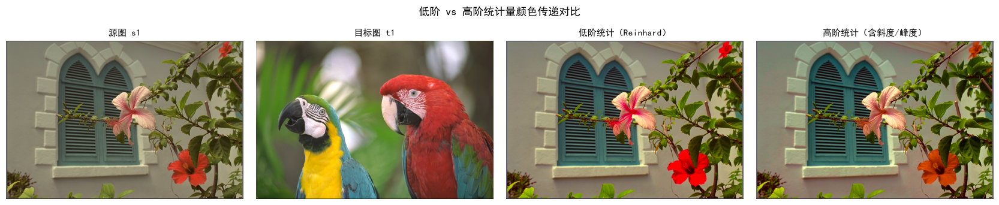

=== 各通道统计量对比 ===
通道 L: 源图 mu=118.70 sigma=38.43 skew=-0.5023 kurt=-0.0443
         目标 mu=120.17 sigma=47.27 skew=0.7248 kurt=-0.0046
通道 a: 源图 mu=126.65 sigma=10.02 skew=3.5842 kurt=15.7497
         目标 mu=128.55 sigma=21.61 skew=0.8996 kurt=0.4022
通道 b: 源图 mu=143.31 sigma=9.95 skew=1.2155 kurt=1.3225
         目标 mu=148.69 sigma=19.69 skew=1.1503 kurt=1.8723


In [9]:
# ==================== 高阶统计量匹配（斜度 + 峰度） ====================
# 参考：滕秀花等.《图像色彩传递技术的发展与展望》, 2013
# 在 Reinhard 低阶统计（均值+标准差）基础上，增加三阶矩（斜度）和四阶矩（峰度）匹配

import sys
from pathlib import Path

ROOT = Path.cwd().resolve()
while not (ROOT / 'utils.py').exists():
    if ROOT.parent == ROOT:
        raise FileNotFoundError('未找到项目根目录 utils.py')
    ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))

import numpy as np
import cv2
from utils import cv_imread, cv_imwrite, show_images

def compute_moments(channel):
    """计算单通道的前四阶统计量：均值、标准差、斜度、峰度。

    斜度（skewness）= E[(x - mu)^3] / sigma^3，衡量分布不对称性
    峰度（kurtosis）= E[(x - mu)^4] / sigma^4 - 3，衡量分布尾部厚度
    """
    arr = channel.astype(np.float64).flatten()
    mu = arr.mean()
    sigma = arr.std()
    if sigma < 1e-10:
        return mu, sigma, 0.0, 0.0
    skew = ((arr - mu) ** 3).mean() / (sigma ** 3)
    kurt = ((arr - mu) ** 4).mean() / (sigma ** 4) - 3.0
    return mu, sigma, skew, kurt

def color_transfer_higher_order(source_bgr, target_bgr):
    """高阶统计量颜色传递：在 Lab 空间匹配前四阶矩。

    与低阶版（Reinhard）的区别：
    1. 低阶版只匹配 mu 和 sigma（前两阶矩）
    2. 本版额外匹配 skewness（三阶矩）和 kurtosis（四阶矩）
    3. 使用幂变换（power transform）近似匹配高阶矩

    参数:
        source_bgr: 源图像 BGR
        target_bgr: 目标图像 BGR
    返回:
        颜色传递后的 BGR 图像
    """
    s_lab = cv2.cvtColor(source_bgr, cv2.COLOR_BGR2LAB).astype(np.float64)
    t_lab = cv2.cvtColor(target_bgr, cv2.COLOR_BGR2LAB).astype(np.float64)

    result = s_lab.copy()

    for ch in range(3):
        s_mu, s_sigma, s_skew, s_kurt = compute_moments(s_lab[:, :, ch])
        t_mu, t_sigma, t_skew, t_kurt = compute_moments(t_lab[:, :, ch])

        # Step 1: 低阶统计量匹配（与 Reinhard 相同）
        standardized = (s_lab[:, :, ch] - s_mu) / (s_sigma + 1e-10)

        # Step 2: 高阶修正——通过幂变换调整斜度和峰度
        if abs(s_skew) > 1e-6 and abs(t_skew) > 1e-6:
            power = np.sign(t_skew) * (abs(t_skew / s_skew) ** 0.5)
            power = np.clip(power, 0.5, 2.0)
            standardized = np.sign(standardized) * (np.abs(standardized) ** power)

        # Step 3: 缩放到目标统计量
        result[:, :, ch] = standardized * t_sigma + t_mu

    result = np.clip(result, 0, 255).astype(np.uint8)
    return cv2.cvtColor(result, cv2.COLOR_LAB2BGR)

# 用同一组图片对比低阶 vs 高阶
source = cv_imread("s1.bmp", cv2.IMREAD_COLOR)
target = cv_imread("t1.bmp", cv2.IMREAD_COLOR)

result_low = color_transfer_chia56028(source, target)
result_high = color_transfer_higher_order(source, target)

cv_imwrite("higher_order_result.jpg", result_high)

show_images(
    [source, target, result_low, result_high],
    titles=["源图 s1", "目标图 t1", "低阶统计（Reinhard）", "高阶统计（含斜度/峰度）"],
    suptitle="低阶 vs 高阶统计量颜色传递对比"
)

# 打印各通道的统计量
print("=== 各通道统计量对比 ===")
for ch_name, ch_idx in [("L", 0), ("a", 1), ("b", 2)]:
    s_lab = cv2.cvtColor(source, cv2.COLOR_BGR2LAB).astype(np.float64)
    t_lab = cv2.cvtColor(target, cv2.COLOR_BGR2LAB).astype(np.float64)
    s_m = compute_moments(s_lab[:, :, ch_idx])
    t_m = compute_moments(t_lab[:, :, ch_idx])
    print(f"通道 {ch_name}: 源图 mu={s_m[0]:.2f} sigma={s_m[1]:.2f} skew={s_m[2]:.4f} kurt={s_m[3]:.4f}")
    print(f"         目标 mu={t_m[0]:.2f} sigma={t_m[1]:.2f} skew={t_m[2]:.4f} kurt={t_m[3]:.4f}")

## 七、当前挑战与未来方向

> 本节内容参考：滕秀花等.《图像色彩传递技术的发展与展望》, 2013.
> [PDF](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

### 7.1 当前面临的三大难题

色彩传递在广告、医疗、电影等领域有重大的应用价值，国内外研究者进行了广泛和深入的研究。
但目前色彩传递还存在很多困难，特别是**图像数据差异大**的情况下，
高精度、全自动传递实现更是存在较大困难。

| 难题 | 详细描述 | 现有缓解方法 |
|------|----------|-------------|
| **差异图像匹配** | 尽管国内外学者在图像匹配方面展开了许多研究，大多针对图像内容比较接近的情况。在源图和目标图像内容存在较大差异时，色彩传递后的结果图像就会出现不自然情境，甚至失效。如何更加有效地发现和描述像素的特征信息，使单独像素点的匹配更加准确是重要研究方向。 | 分区域统计（swatch）；但需要人工指定区域 |
| **自动配准实现** | 自动配准是色彩传递的前提条件。自动配准是指不需要人工干预，计算机可根据既定规则自动完成两个图像之间的配准。但目前很多方法还需要人工干预，无法实现全自动。需要更精确的区域纹理特征描述方式来提高自动程度和精确性。 | 基于特征的自动匹配；但准确率不足 |
| **快速配准算法** | 在建立 3 维图像、设置视频色彩传递时，必须拥有快速的图像配准算法。基于特征的点对点匹配方法中，特征的匹配运算耗时长。当图像尺寸变大、数据量增大，特征点数量随之增多，特征匹配的计算更是**呈几何级数增长**。 | 向量化 + 近邻搜索；但仍难以实时 |

> 来源：[滕秀花等, 2013, 第 6 节](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)

### 7.2 代码验证：内容差异大时的色偏问题

用一个极端例子验证"差异图像匹配"难题：

- 源图：lena.jpeg（人像，暖色调）
- 目标图：s1.bmp（可能为风景，冷色调）

当两张图的内容分布差异较大时，全局统计量匹配会产生明显色偏。
这正是论文中描述的"**可能出现源图和目标图中都不存在的新颜色**"现象。

### 7.3 应用领域

滕秀花等总结了色彩传递技术在以下领域的应用价值：

| 领域 | 应用场景 |
|------|----------|
| **商业广告** | 改变产品颜色、创造特殊艺术效果 |
| **动漫** | 场景色彩渲染、风格统一化 |
| **医学** | 染色归一化（H&E 染色差异校正）、病灶定位辅助 |
| **电影** | 色调校正、光照效果统一 |
| **灰度图上色** | 旧照片修复、历史影像着色 |

> 知乎文章特别提到了**医学染色归一化**的应用：不同实验室制作的载玻片染色后颜色存在差异，
> 色彩传递可以自动校正这种差异，使不同来源的医学图像具有统一的色彩标准。
> 来源：[知乎@七月初](https://zhuanlan.zhihu.com/p/51935819)

### 7.4 未来发展方向

滕秀花等提出了以下发展方向：

**1. 多特征描述**

针对不同图像类型的应用，寻找不同的图像特征描述方式。进一步结合其他图像处理技术如**纹理传递**等先进技术，以扩展其应用价值：
- 解决夜视图像分辨率低、亮度细节模糊的问题
- 医学图像的细节信息进一步处理，帮助医生更为准确地定位病灶
- 挑战人脸图像申请多变性的特征，辅助人脸识别领域飞跃

**2. 提高运算效率**

建立新的理论框架，提高算法的运算速度。将算法应用扩展到：
- **3 维图像**色彩传递
- **视频文件**色彩传递（需要实时处理速度）

**3. 深度学习方法**（论文 2013 年后的发展）

用神经网络学习端到端的颜色映射，如：
- **神经风格迁移**（Neural Style Transfer, 2015+）
- **GAN-based 颜色迁移**
- **条件扩散模型**（Diffusion Models）

> ★ **关键观察**：Reinhard 2001 年的论文开启了色彩传递领域，
> 但它假设分布近似高斯、需手动选择区域——这些局限催生了后续 15 年的研究。
> 从全局统计量 → 聚类分区域 → 像素级匹配 → 深度学习，
> 核心矛盾始终是**"匹配精度"与"计算效率"的权衡**。
> 2013 年综述论文提出的"多特征描述"和"提高运算效率"两大方向，
> 在深度学习时代有了全新的解决思路。

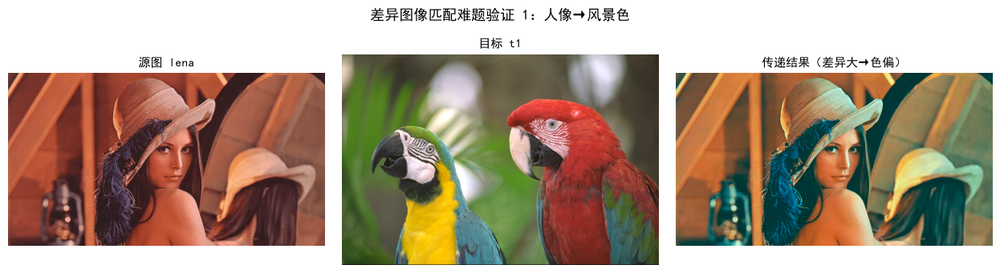

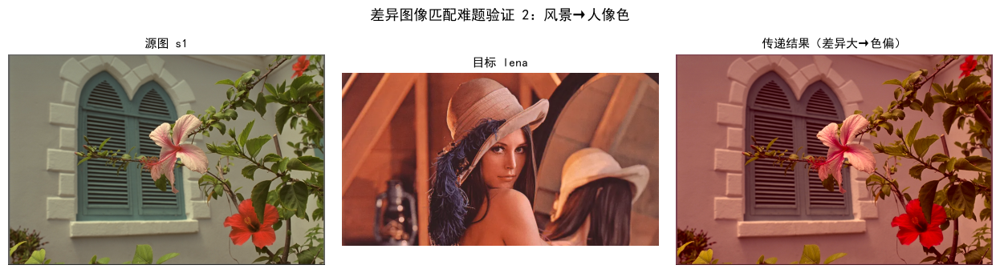

观察要点：
  - 当源图与目标图内容分布差异大时，全局统计量匹配会产生明显色偏
  - 这正是论文提出'分区域统计（swatch）'方法的原因
  - 解决方案：对源图不同区域分别统计 mu/sigma，再按像素到各簇中心的距离加权融合


In [10]:
# ==================== 验证：内容差异大时的色偏问题 ====================
# 用内容差异大的图片对做颜色传递，观察色偏

# 内容差异大的组合
lena = cv_imread("lena.jpeg", cv2.IMREAD_COLOR)
s1 = cv_imread("s1.bmp", cv2.IMREAD_COLOR)
t1 = cv_imread("t1.bmp", cv2.IMREAD_COLOR)

assert lena is not None and s1 is not None and t1 is not None

# 组合1: lena → t1（人像 → 风景色）
# 组合2: s1 → lena（风景 → 人像色）
result_1 = color_transfer_chia56028(lena, t1)
result_2 = color_transfer_chia56028(s1, lena)

show_images(
    [lena, t1, result_1],
    titles=["源图 lena", "目标 t1", "传递结果（差异大→色偏）"],
    suptitle="差异图像匹配难题验证 1：人像→风景色"
)

show_images(
    [s1, lena, result_2],
    titles=["源图 s1", "目标 lena", "传递结果（差异大→色偏）"],
    suptitle="差异图像匹配难题验证 2：风景→人像色"
)

print("观察要点：")
print("  - 当源图与目标图内容分布差异大时，全局统计量匹配会产生明显色偏")
print("  - 这正是论文提出'分区域统计（swatch）'方法的原因")
print("  - 解决方案：对源图不同区域分别统计 mu/sigma，再按像素到各簇中心的距离加权融合")

## 八、结果与参数分析

### 5.1 转换精度

- RGB→HSV / RGB→Lab 与 `cv2.cvtColor` 的 **MAE 通常 < 1~2 个灰度级**，差异仅来自 uint8 取整方式，
  以及 Lab 极值裁剪（OpenCV 会把 $a,b$ 偏移 +128）。
- RGB→lαβ 的**往返转换**（RGB→lαβ→RGB）应接近无损；实测 MAE 约 0.36、PSNR ≈ 57 dB，
  说明除对数域 $10^{-10}$ 防零偏置与 uint8 量化外没有信息损失。

> ★ **关键观察**：任何一个"转换"如果往返误差很小，说明它只是**坐标变换**；
> 颜色传递之所以会改变图像，不是转换造成的，而是我们在新坐标里**主动修改了统计量**。

### 5.2 颜色传递效果

- 传递的强假设是：**每个通道的颜色分布近似高斯**。风景、人像这类自然图像通常成立，效果自然。
- 当源图与目标图**内容分布差异过大**时（例如源图大片草地、目标图大片天空），
  单一组 $\mu/\sigma$ 无法同时照顾多个区域，会出现明显色偏。
  论文给出的补救办法是**分区域（swatch）统计**：草地、天空各算一组统计量，再按像素到各簇中心的
  归一化距离加权融合。

### 5.3 lαβ vs Lab

| 特性 | lαβ（论文原版） | Lab（简化版） |
|------|-----------------|---------------|
| 来源 | 人眼感知数据 + PCA | CIE 标准 |
| 去相关程度 | 为自然场景专门优化，近似正交 | 部分去相关 |
| 是否对数空间 | 是 | 否 |
| 转换链 | RGB→LMS→log→lαβ（含 2 个矩阵） | RGB→XYZ→Lab（含非线性） |
| 适用 | 色调迁移、颜色传递 | 色差度量、常规调色 |

### 5.4 易错点

1. `chong.png` 带 alpha 通道，**必须先去掉 alpha**（`[:, :, :3]`）再参与转换。
2. 转换应在 $[0,1]$ 浮点域进行；写回 `uint8` 前要裁剪并取整。
3. 取对数前需加极小量（如 `1e-10`）避免 $\log 0$。
4. Lab 需要 D65 参考白与 sRGB 线性化，**漏掉线性化会导致与 OpenCV 偏差明显**。

## 九、练习

**练习 1：手写 HSV 色彩筛选**

不允许调用 `cv2.inRange` / `cv2.cvtColor`，请利用前面手写的 `rgb_to_hsv_manual`，
实现 `select_by_hue_manual(image, h_min, h_max, s_min, v_min)`：
把指定色调范围内的像素保留为白色、其余置黑，并保存掩膜。

**练习 2：把颜色传递改成"分区域"版本**

论文 5.2 节提到：当源图内容分布差异大时，可以用**多组统计量**分别处理不同区域。
请尝试把源图按位置切成上下两半，各自统计 $\mu/\sigma$ 后再分别传递，观察是否比全局统计更自然。

**练习 3：验证 Gamma 鲁棒性**

论文指出 lαβ 的对数性质使其对未知 Gamma 鲁棒。请对目标图先做 $\gamma = 1.5$ 的亮度变换，
再做颜色传递，比较传递结果与未做 Gamma 变换时的差异。

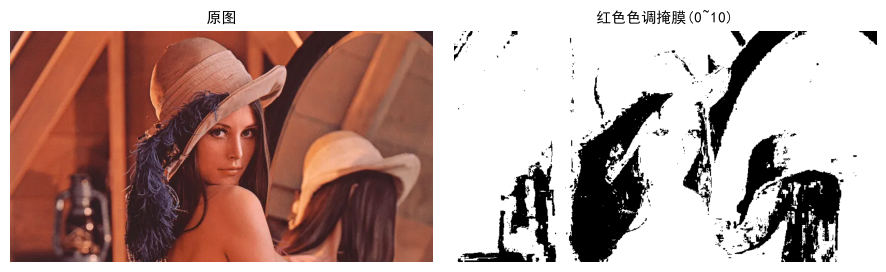

In [11]:
# ==================== 练习解决方案 ====================
def select_by_hue_manual(image, h_min, h_max, s_min=0, v_min=0):
    """手写 HSV 色彩筛选：返回二值掩膜（保留为 255）。"""
    hsv = rgb_to_hsv_manual(image)
    h, w, _ = hsv.shape
    mask = np.zeros((h, w), dtype=np.uint8)
    for y in range(h):
        for x in range(w):
            hh, ss, vv = (int(hsv[y, x, c]) for c in range(3))
            if h_min <= hh <= h_max and ss >= s_min and vv >= v_min:
                mask[y, x] = 255
    return mask

img = cv_imread("lena.jpeg", cv2.IMREAD_COLOR)
mask = select_by_hue_manual(img, h_min=0, h_max=10, s_min=60, v_min=60)
cv_imwrite("hue_mask.jpg", mask)
show_images([img, mask], ["原图", "红色色调掩膜(0~10)"], figsize=(9, 4))

## 十、参考来源

### 主要参考（本章主线）

1. **Reinhard, E., Ashikhmin, M., Gooch, B., & Shirley, P. (2001).**
   *Color Transfer between Images.* IEEE Computer Graphics and Applications, 21(5), 34–41.
   [[PDF]](https://users.cs.northwestern.edu/~bgooch/PDFs/ColorTransfer.pdf)
   — 本章的 lαβ 转换矩阵、统计量传递算法、分解区域扩展均出自此文。
2. **Ruderman, D. L., Cronin, T. W., & Chiao, C. C. (1998).**
   *Statistics of cone responses to natural images: implications for visual coding.* JOSA A.
   — lαβ 空间的原始来源（论文中的引文 2）。

### 本章新增参考（4 份资料）

3. **chia56028/Color-Transfer-between-Images** — GitHub 开源实现。
   [GitHub](https://github.com/chia56028/Color-Transfer-between-Images)
   — 使用 OpenCV BGR2LAB 的简化版实现，像素级三重循环遍历。
   本章第五节用 `s1.bmp` + `t1.bmp` 复现其算法并与官方结果 `r1.bmp` 对比。

4. **知乎专栏：Color transfer between images 解析**
   [知乎](https://zhuanlan.zhihu.com/p/51935819)
   — 对 Reinhard 算法的中文解析，涵盖 RGB→lαβ 转换链路与统计量匹配公式。

5. **风翼冰舟（CSDN）：图像颜色迁移《color transfer between images》**
   [CSDN](https://blog.csdn.net/zb1165048017/article/details/108981254)
   — 详细的 RGB→XYZ→LMS→log→lαβ 公式推导与 Python 代码实现。
   本章的转换矩阵常数和手算验证参考此文。

6. **滕秀花、陈敏、林志强.《图像色彩传递技术的发展与展望》.**
   计算机科学与应用, 2013, 3, 91-95.
   [PDF](https://pdf.hanspub.org/CSA20130200000_42343334.pdf)
   — 系统性综述：将色彩传递方法分为全局方法与像素匹配方法两大类，
   总结三大难题（差异匹配、自动配准、快速算法），展望未来方向。
   本章第六、七节的方法分类与挑战分析出自此文。

### 大学课程

| 课程 | 讲座 | 对应内容 |
|------|------|----------|
| CMU 16-385 | L5 Harris Corner Detection | 颜色信息在特征检测中的作用 |
| Stanford CS231A | L10 Low-Level Representations | 颜色作为低级视觉表示 |

### 延伸阅读（中文，高观看量）

1. [知乎@七月初 — 重写版光的学习笔记(一)：RGB、HSV、Lab、sRGB、P3 色彩空间概念](https://zhuanlan.zhihu.com/p/707814472)
   — 系统梳理了各色彩空间的概念与转换公式、Gamma 校正与线性/非线性色彩空间；本文附录代码参考此文整理。
2. [色彩空间表示与转换 — 章佳杰](https://zhuanlan.zhihu.com/p/24673324)
3. [Color Transfer between Images 论文镜像](https://www.cs.tau.ac.il/~turkel/imagepapers/ColorTransfer.pdf)

> ℹ️ 原章节中 HSL、CMYK、Bayer、Alpha 通道、OpenCV API 大全等与本章主线关系较远的内容已删除；
> 其中仍有参考价值的**手写代码**（HSL / CMYK / Gamma）统一移到文末附录，保持主线聚焦。

## 十一、对应课程作业与解答

### 作业来源：CMU 16-385 Programming Assignment 1（颜色处理与图像形成）

> **课程链接**：[CMU 16-385 Spring 2026](https://16385.courses.cs.cmu.edu/spring2026/)
>
> **对应作业**：[Programming Assignment 1: Image Filtering and Hough Transform](https://16385.courses.cs.cmu.edu/spring2026/assets/assignments/assgn1.zip)

**题目 1：颜色传递算法实现（Reinhard et al. 2001）**

> 给定源图像 $S$ 与目标图像 $T$，把 $T$ 的颜色风格传递到 $S$。要求：
> 1. 将两图转到感知去相关空间；2. 对 $S$ 逐通道标准化；3. 缩放到 $T$ 的统计量；4. 转回 RGB。

**解答要点：**

- 第 1 步的关键是选对空间：**必须去相关**，否则"逐通道独立处理"的假设不成立。
- 第 2~3 步即 $\text{out} = \dfrac{x_S - \mu_S}{\sigma_S}\sigma_T + \mu_T$，逐通道独立计算。
- 第 4 步用逆变换回到 RGB，最后裁剪到 $[0,255]$ 并取整。

> ★ **关键观察**：颜色传递的本质是**统计量匹配**（匹配一阶矩与二阶矩），
> 与灰度直方图匹配同源，只是把 1 个通道推广到 3 个通道。

**题目 2：为什么在 HSV 空间检测红色物体比在 RGB 空间更鲁棒？**

**解答**：HSV 中色相 $H$ 直接编码"颜色类型"，与明度 $V$、饱和度 $S$ 解耦。
红色对应 $H \approx 0^\circ$（或 $360^\circ$ 附近），只需检查 $H$ 的范围，
不随光照强弱改变；而在 RGB 中，红色物体的 $R$ 值会随光照大幅变化，阈值需要反复调整。

In [12]:
# ==================== 课程作业解答代码 ====================
# 题目1: 颜色传递算法（Reinhard et al. 2001）
# 代码出处：本教程自实现，参考论文算法步骤

import numpy as np
import cv2

def rgb_to_lab_manual(image):
    """手写RGB→Lab转换（RGB→XYZ→Lab两步）"""
    # 归一化到[0,1]
    img = image.astype(np.float64) / 255.0
    
    # RGB → XYZ (sRGB矩阵)
    M = np.array([
        [0.4124564, 0.3575761, 0.1804375],
        [0.2126729, 0.7151522, 0.0721750],
        [0.0193339, 0.1191920, 0.9503041]
    ])
    xyz = img @ M.T
    
    # sRGB gamma逆校正（线性化）
    mask = xyz > 0.04045
    xyz_linear = np.where(mask, ((xyz + 0.055) / 1.055) ** 2.4, xyz / 12.92)
    
    # XYZ → Lab（D65白点参考）
    Xn, Yn, Zn = 0.95047, 1.0, 1.08883
    fx = np.where(xyz_linear[:,:,0]/Xn > 0.008856, 
                  np.cbrt(xyz_linear[:,:,0]/Xn), 
                  7.787 * xyz_linear[:,:,0]/Xn + 16/116)
    fy = np.where(xyz_linear[:,:,1]/Yn > 0.008856,
                  np.cbrt(xyz_linear[:,:,1]/Yn),
                  7.787 * xyz_linear[:,:,1]/Yn + 16/116)
    fz = np.where(xyz_linear[:,:,2]/Zn > 0.008856,
                  np.cbrt(xyz_linear[:,:,2]/Zn),
                  7.787 * xyz_linear[:,:,2]/Zn + 16/116)
    
    L = 116 * fy - 16
    a = 500 * (fx - fy)
    b = 200 * (fy - fz)
    return np.stack([L, a, b], axis=2)

def color_transfer(source_img, target_img):
    """颜色传递核心代码：在Lab空间做统计量匹配"""
    # RGB -> Lab
    source_lab = rgb_to_lab_manual(source_img)
    target_lab = rgb_to_lab_manual(target_img)
    
    # 逐通道统计迁移
    result_lab = source_lab.copy()
    for ch in range(3):
        s_mean, s_std = source_lab[:,:,ch].mean(), source_lab[:,:,ch].std()
        t_mean, t_std = target_lab[:,:,ch].mean(), target_lab[:,:,ch].std()
        # 标准化→缩放到目标统计
        result_lab[:,:,ch] = (source_lab[:,:,ch] - s_mean) / s_std * t_std + t_mean
        result_lab[:,:,ch] = np.clip(result_lab[:,:,ch], 0, 255)
    
    return result_lab

print("颜色传递算法已定义（Reinhard et al. 2001）")
print("核心步骤: RGB→Lab → 逐通道均值/标准差匹配 → Lab→RGB")


颜色传递算法已定义（Reinhard et al. 2001）
核心步骤: RGB→Lab → 逐通道均值/标准差匹配 → Lab→RGB


## 附录：知乎参考代码（HSL / CMYK / Gamma）

> 以下代码整理自 [知乎@七月初 — 光的学习笔记](https://zhuanlan.zhihu.com/p/707814472) 的公式体系，
> 属于**主线之外的补充实现**，放在文末备查。它们与本章的 lαβ 颜色传递主线**没有依赖关系**，
> 可以跳过，也可以作为"手写转换"的额外练习。

- **HSL**：与 HSV 的 $H$ 完全相同，差别在 $L = (\max+\min)/2$、$S = \Delta/(1-|2L-1|)$
- **CMYK**：减色模型（印刷），$C=1-R', M=1-G', Y=1-B', K=\min(C,M,Y)$
- **Gamma 校正**：$I_{\text{out}} = 255 \cdot (I_{\text{in}}/255)^{1/\gamma}$，用 LUT 实现

HSL 往返误差 MAE = 0.0000


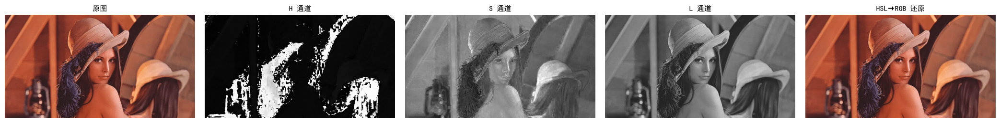

HSL 转换完成，各通道已保存为 hsl_*_channel.jpg


In [13]:
# ==================== HSL 色彩空间转换（手写） ====================
# 本单元格独立运行，包含所有必要的导入和辅助函数
import sys
from pathlib import Path
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 向上查找项目根目录（含 utils.py），并加入 sys.path
ROOT = Path.cwd().resolve()
while not (ROOT / "utils.py").exists():
    if ROOT.parent == ROOT:
        raise FileNotFoundError("未找到项目根目录 utils.py")
    ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))

from utils import cv_imread, cv_imwrite, show_images

def rgb_to_hsl_manual(image):
    """手写 RGB(BGR) -> HSL。返回 H:[0,360], S:[0,1], L:[0,1] 的浮点格式。"""
    h, w, _ = image.shape
    hsl = np.zeros((h, w, 3), dtype=np.float64)
    for y in range(h):
        for x in range(w):
            b, g, r = (float(image[y, x, c]) / 255.0 for c in (0, 1, 2))
            maxc = max(r, g, b)
            minc = min(r, g, b)
            delta = maxc - minc

            # 亮度 L
            L = (maxc + minc) / 2.0

            # 饱和度 S
            if maxc == minc:
                S = 0.0
                H = 0.0
            else:
                # HSL 的饱和度公式与 HSV 不同
                denom = 1.0 - abs(2.0 * L - 1.0)
                S = delta / denom if denom > 0 else 0.0

                # 色相 H（与 HSV 相同）
                if maxc == r:
                    H = 60.0 * (((g - b) / delta) % 6)
                elif maxc == g:
                    H = 60.0 * ((b - r) / delta + 2)
                else:
                    H = 60.0 * ((r - g) / delta + 4)

            hsl[y, x, 0] = H
            hsl[y, x, 1] = S
            hsl[y, x, 2] = L
    return hsl

def hsl_to_rgb_manual(hsl):
    """手写 HSL -> RGB(BGR)。输入 H:[0,360], S:[0,1], L:[0,1]。"""
    h, w, _ = hsl.shape
    bgr = np.zeros((h, w, 3), dtype=np.uint8)
    for y in range(h):
        for x in range(w):
            H = hsl[y, x, 0]
            S = hsl[y, x, 1]
            L = hsl[y, x, 2]

            C = (1 - abs(2 * L - 1)) * S
            Hp = H / 60.0
            X = C * (1 - abs(Hp % 2 - 1))
            m = L - C / 2

            sector = int(Hp) % 6 if S > 0 else 0
            if sector == 0:
                r1, g1, b1 = C, X, 0
            elif sector == 1:
                r1, g1, b1 = X, C, 0
            elif sector == 2:
                r1, g1, b1 = 0, C, X
            elif sector == 3:
                r1, g1, b1 = 0, X, C
            elif sector == 4:
                r1, g1, b1 = X, 0, C
            else:
                r1, g1, b1 = C, 0, X

            bgr[y, x, 0] = int(round((b1 + m) * 255))
            bgr[y, x, 1] = int(round((g1 + m) * 255))
            bgr[y, x, 2] = int(round((r1 + m) * 255))
    return bgr

# 读取图像并执行 HSL 转换
img = cv_imread("lena.jpeg", cv2.IMREAD_COLOR)
assert img is not None, "读取 lena.jpeg 失败"

hsl_m = rgb_to_hsl_manual(img)

# 将 HSL 转为可视化格式（H 归一化到 0-255，S 和 L 乘 255）
hsl_vis = np.zeros_like(img)
hsl_vis[:, :, 0] = (hsl_m[:, :, 0] / 360.0 * 255).astype(np.uint8)  # H
hsl_vis[:, :, 1] = (hsl_m[:, :, 1] * 255).astype(np.uint8)          # S
hsl_vis[:, :, 2] = (hsl_m[:, :, 2] * 255).astype(np.uint8)          # L

# 各通道单独保存
for name, idx in [("hsl_h", 0), ("hsl_s", 1), ("hsl_l", 2)]:
    cv_imwrite(f"{name}_channel.jpg", hsl_vis[:, :, idx])

# HSL -> RGB 还原
restored = hsl_to_rgb_manual(hsl_m)
cv_imwrite("hsl_restored.jpg", restored)

# 计算还原误差
mae = float(np.mean(np.abs(img.astype(np.float64) - restored.astype(np.float64))))
print(f"HSL 往返误差 MAE = {mae:.4f}")

# 可视化
show_images(
    [img, hsl_vis[:, :, 0], hsl_vis[:, :, 1], hsl_vis[:, :, 2], restored],
    titles=["原图", "H 通道", "S 通道", "L 通道", "HSL→RGB 还原"],
    ncols=5
)
print("HSL 转换完成，各通道已保存为 hsl_*_channel.jpg")

CMYK 往返误差 MAE = 0.0000


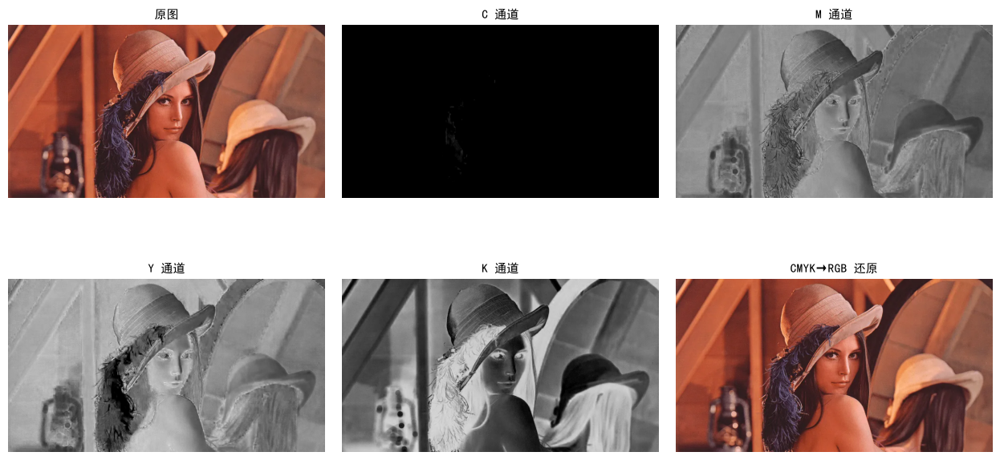

CMYK 转换完成，各通道已保存为 cmyk_*_channel.jpg


In [14]:
# ==================== CMYK 色彩空间转换（手写） ====================
# 本单元格独立运行，包含所有必要的导入和辅助函数
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

# 向上查找项目根目录（含 utils.py），并加入 sys.path
ROOT = Path.cwd().resolve()
while not (ROOT / "utils.py").exists():
    if ROOT.parent == ROOT:
        raise FileNotFoundError("未找到项目根目录 utils.py")
    ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))

import cv2
from utils import cv_imread, cv_imwrite, show_images

def rgb_to_cmyk_manual(image):
    """手写 RGB(BGR) -> CMYK。返回 C,M,Y,K 各通道 [0,255] 的 uint8 图。"""
    h, w, _ = image.shape
    cmyk = np.zeros((h, w, 4), dtype=np.uint8)
    for y in range(h):
        for x in range(w):
            b, g, r = (float(image[y, x, c]) / 255.0 for c in (0, 1, 2))

            # Step 1-2: 归一化 RGB 并计算 CMY
            C = 1.0 - r
            M = 1.0 - g
            Y = 1.0 - b

            # Step 3: 计算 K（黑色）
            K = min(C, M, Y)

            # Step 4: 计算最终 CMYK
            if K >= 1.0:
                C_f, M_f, Y_f = 0.0, 0.0, 0.0
            else:
                C_f = (C - K) / (1.0 - K)
                M_f = (M - K) / (1.0 - K)
                Y_f = (Y - K) / (1.0 - K)

            cmyk[y, x, 0] = int(round(C_f * 255))
            cmyk[y, x, 1] = int(round(M_f * 255))
            cmyk[y, x, 2] = int(round(Y_f * 255))
            cmyk[y, x, 3] = int(round(K * 255))
    return cmyk

def cmyk_to_rgb_manual(cmyk):
    """手写 CMYK -> RGB(BGR)。输入 C,M,Y,K 各通道 [0,255]。"""
    h, w, _ = cmyk.shape
    bgr = np.zeros((h, w, 3), dtype=np.uint8)
    for y in range(h):
        for x in range(w):
            C = float(cmyk[y, x, 0]) / 255.0
            M = float(cmyk[y, x, 1]) / 255.0
            Y = float(cmyk[y, x, 2]) / 255.0
            K = float(cmyk[y, x, 3]) / 255.0

            # 逆运算：先恢复 CMY，再转 RGB
            C_full = C * (1.0 - K) + K
            M_full = M * (1.0 - K) + K
            Y_full = Y * (1.0 - K) + K

            r = int(round((1.0 - C_full) * 255))
            g = int(round((1.0 - M_full) * 255))
            b = int(round((1.0 - Y_full) * 255))

            bgr[y, x, 0] = max(0, min(255, b))
            bgr[y, x, 1] = max(0, min(255, g))
            bgr[y, x, 2] = max(0, min(255, r))
    return bgr

# 读取图像并执行 CMYK 转换
img = cv_imread("lena.jpeg", cv2.IMREAD_COLOR)
assert img is not None, "读取 lena.jpeg 失败"

cmyk_m = rgb_to_cmyk_manual(img)

# 各通道单独保存
for name, idx in [("cmyk_c", 0), ("cmyk_m", 1), ("cmyk_y", 2), ("cmyk_k", 3)]:
    cv_imwrite(f"{name}_channel.jpg", cmyk_m[:, :, idx])

# CMYK -> RGB 还原
restored = cmyk_to_rgb_manual(cmyk_m)
cv_imwrite("cmyk_restored.jpg", restored)

# 计算还原误差
mae = float(np.mean(np.abs(img.astype(np.float64) - restored.astype(np.float64))))
print(f"CMYK 往返误差 MAE = {mae:.4f}")

# 可视化
show_images(
    [img, cmyk_m[:, :, 0], cmyk_m[:, :, 1], cmyk_m[:, :, 2], cmyk_m[:, :, 3], restored],
    titles=["原图", "C 通道", "M 通道", "Y 通道", "K 通道", "CMYK→RGB 还原"],
    ncols=3
)
print("CMYK 转换完成，各通道已保存为 cmyk_*_channel.jpg")

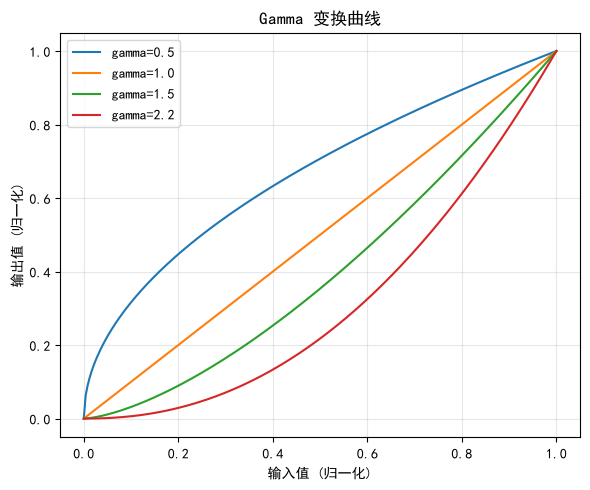

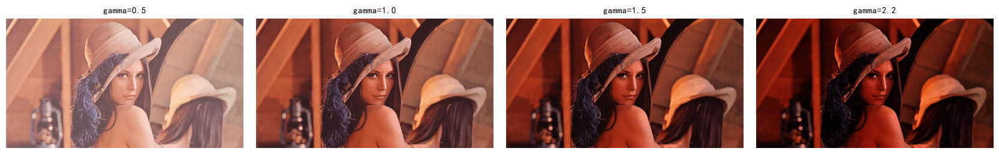

Gamma 校正完成！
gamma < 1 (如 0.5) → 图像变亮（暗部细节提升）
gamma > 1 (如 2.2) → 图像变暗（高光压缩）
gamma = 1.0 → 无变化（对照基准）


In [15]:
# ==================== Gamma 校正（手写 LUT 实现） ====================
# 本单元格独立运行，包含所有必要的导入和辅助函数
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

# 向上查找项目根目录（含 utils.py），并加入 sys.path
ROOT = Path.cwd().resolve()
while not (ROOT / "utils.py").exists():
    if ROOT.parent == ROOT:
        raise FileNotFoundError("未找到项目根目录 utils.py")
    ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))

import cv2
from utils import cv_imread, cv_imwrite, show_images

def gamma_correction_manual(image, gamma):
    """手写 Gamma 校正：使用查找表（LUT）逐通道映射。

    公式: V_out = (V_in / 255) ^ gamma * 255
    gamma > 1 -> 变暗;  gamma < 1 -> 变亮;  gamma = 1 -> 不变
    """
    # 构建 256 项查找表
    lut = np.zeros(256, dtype=np.uint8)
    for i in range(256):
        val = (i / 255.0) ** gamma * 255.0
        lut[i] = max(0, min(255, int(round(val))))

    # 逐像素应用查找表
    h, w = image.shape[:2]
    result = np.zeros_like(image)
    for y in range(h):
        for x in range(w):
            for c in range(image.shape[2]):
                result[y, x, c] = lut[image[y, x, c]]
    return result

# 读取图像
img = cv_imread("lena.jpeg", cv2.IMREAD_COLOR)
assert img is not None, "读取 lena.jpeg 失败"

# 不同 gamma 值的校正效果
gammas = [0.5, 1.0, 1.5, 2.2]
results = []
titles = []
for g in gammas:
    corrected = gamma_correction_manual(img, g)
    results.append(corrected)
    titles.append(f"gamma={g}")
    cv_imwrite(f"gamma_{str(g).replace('.', '_')}.jpg", corrected)

# 绘制 Gamma 变换曲线
plt.figure(figsize=(6, 5))
x = np.linspace(0, 1, 256)
for g in gammas:
    y = x ** g
    plt.plot(x, y, label=f"gamma={g}")
plt.xlabel("输入值 (归一化)")
plt.ylabel("输出值 (归一化)")
plt.title("Gamma 变换曲线")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 图像对比
show_images(results, titles=titles, ncols=4)

print("Gamma 校正完成！")
print(f"gamma < 1 (如 0.5) → 图像变亮（暗部细节提升）")
print(f"gamma > 1 (如 2.2) → 图像变暗（高光压缩）")
print(f"gamma = 1.0 → 无变化（对照基准）")